In [24]:
import pandas as pd
import arff
import warnings
warnings.filterwarnings('ignore')

data_freq = arff.load('/Users/ayseljafarova/Desktop/Huk Coburg/freMTPL2freq.arff')
df_freq = pd.DataFrame(data_freq , columns=["IDpol", "ClaimNb", "Exposure", "Area", "VehPower",
"VehAge", "DrivAge", "BonusMalus", "VehBrand", "VehGas", "Density", "Region"] )
data_sev = arff.load('/Users/ayseljafarova/Desktop/Huk Coburg/freMTPL2sev.arff')
df_sev = pd.DataFrame(data_sev, columns=["IDpol", "ClaimAmount"])

In [25]:
df_freq.head()

,IDpol,ClaimNb,Exposure,Area,VehPower,VehAge,DrivAge,BonusMalus,VehBrand,VehGas,Density,Region
0,1.0,1.0,0.10,'D',5.0,0.0,55.0,50.0,'B12',Regular,1217.0,'R82'
1,3.0,1.0,0.77,'D',5.0,0.0,55.0,50.0,'B12',Regular,1217.0,'R82'
2,5.0,1.0,0.75,'B',6.0,2.0,52.0,50.0,'B12',Diesel,54.0,'R22'
3,10.0,1.0,0.09,'B',7.0,0.0,46.0,50.0,'B12',Diesel,76.0,'R72'
4,11.0,1.0,0.84,'B',7.0,0.0,46.0,50.0,'B12',Diesel,76.0,'R72'


In [26]:
df_freq.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 678013 entries, 0 to 678012
Data columns (total 12 columns):
 #   Column      Non-Null Count   Dtype  
---  ------      --------------   -----  
 0   IDpol       678013 non-null  float64
 1   ClaimNb     678013 non-null  float64
 2   Exposure    678013 non-null  float64
 3   Area        678013 non-null  object 
 4   VehPower    678013 non-null  float64
 5   VehAge      678013 non-null  float64
 6   DrivAge     678013 non-null  float64
 7   BonusMalus  678013 non-null  float64
 8   VehBrand    678013 non-null  object 
 9   VehGas      678013 non-null  object 
 10  Density     678013 non-null  float64
 11  Region      678013 non-null  object 
dtypes: float64(8), object(4)
memory usage: 62.1+ MB


In [27]:
df_sev.head()

,IDpol,ClaimAmount
0,1552.0,995.20
1,1010996.0,1128.12
2,4024277.0,1851.11
3,4007252.0,1204.00
4,4046424.0,1204.00


In [28]:
df_sev.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 26639 entries, 0 to 26638
Data columns (total 2 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   IDpol        26639 non-null  float64
 1   ClaimAmount  26639 non-null  float64
dtypes: float64(2)
memory usage: 416.4 KB


In [29]:
#Left join we want to keep all policies from freMTPL2freq, even if they have no claims
data = pd.merge(df_freq, df_sev, on='IDpol', how='left')
data.head()

,IDpol,ClaimNb,Exposure,Area,VehPower,VehAge,DrivAge,BonusMalus,VehBrand,VehGas,Density,Region,ClaimAmount
0,1.0,1.0,0.10,'D',5.0,0.0,55.0,50.0,'B12',Regular,1217.0,'R82',NaN
1,3.0,1.0,0.77,'D',5.0,0.0,55.0,50.0,'B12',Regular,1217.0,'R82',NaN
2,5.0,1.0,0.75,'B',6.0,2.0,52.0,50.0,'B12',Diesel,54.0,'R22',NaN
3,10.0,1.0,0.09,'B',7.0,0.0,46.0,50.0,'B12',Diesel,76.0,'R72',NaN
4,11.0,1.0,0.84,'B',7.0,0.0,46.0,50.0,'B12',Diesel,76.0,'R72',NaN


In [30]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 679513 entries, 0 to 679512
Data columns (total 13 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   IDpol        679513 non-null  float64
 1   ClaimNb      679513 non-null  float64
 2   Exposure     679513 non-null  float64
 3   Area         679513 non-null  object 
 4   VehPower     679513 non-null  float64
 5   VehAge       679513 non-null  float64
 6   DrivAge      679513 non-null  float64
 7   BonusMalus   679513 non-null  float64
 8   VehBrand     679513 non-null  object 
 9   VehGas       679513 non-null  object 
 10  Density      679513 non-null  float64
 11  Region       679513 non-null  object 
 12  ClaimAmount  26444 non-null   float64
dtypes: float64(9), object(4)
memory usage: 67.4+ MB


In [31]:
data.VehBrand.value_counts()

VehBrand
'B12'    166398
'B1'     163125
'B2'     160179
'B3'      53520
'B5'      34835
'B6'      28611
'B4'      25225
'B10'     17740
'B11'     13623
'B13'     12206
'B14'      4051
Name: count, dtype: int64

In [32]:
data.VehPower.value_counts().sort_index()

VehPower
4.0     115640
5.0     125101
6.0     149305
7.0     145687
8.0      47046
9.0      30147
10.0     31434
11.0     18401
12.0      8231
13.0      3234
14.0      2358
15.0      2929
Name: count, dtype: int64

In [33]:
data.Exposure.value_counts().sort_index()

Exposure
0.002732    1060
0.002740    2045
0.005464     609
0.005479    1397
0.008197     620
            ... 
1.930000       1
1.980000       1
1.990000       1
2.000000       1
2.010000       2
Name: count, Length: 181, dtype: int64

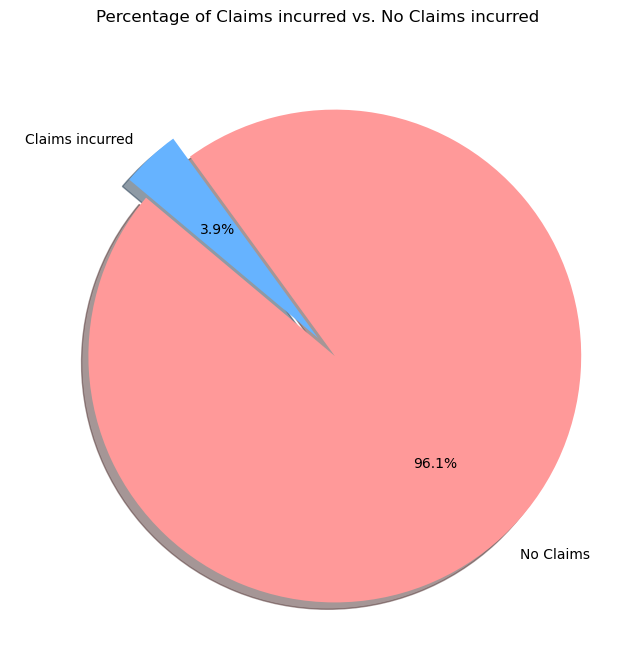

In [34]:
import matplotlib.pyplot as plt
import seaborn as sns


null_count = data['ClaimAmount'].isnull().sum()
non_null_count = data['ClaimAmount'].notnull().sum()


labels = ['No Claims', 'Claims incurred']
sizes = [null_count, non_null_count]
colors = ['#ff9999','#66b3ff']
explode = (0.1, 0)  


plt.figure(figsize=(8, 8))
plt.pie(sizes, explode=explode, labels=labels, colors=colors, autopct='%1.1f%%',
        shadow=True, startangle=140)
plt.title('Percentage of Claims incurred vs. No Claims incurred')
plt.show()

In [35]:
data["ClaimNb"].value_counts()

ClaimNb
0.0     643953
1.0      32178
2.0       3082
3.0        206
11.0        23
4.0         22
16.0        16
5.0         10
9.0          9
8.0          8
6.0          6
Name: count, dtype: int64

In [36]:
data['IDpol'].unique().shape[0]

678013

In [37]:
data.columns

Index(['IDpol', 'ClaimNb', 'Exposure', 'Area', 'VehPower', 'VehAge', 'DrivAge',
       'BonusMalus', 'VehBrand', 'VehGas', 'Density', 'Region', 'ClaimAmount'],
      dtype='object')

In [38]:
# Aggregated the data by 'IDpol'
aggregated_data = data.groupby('IDpol').agg({
    'ClaimAmount': 'sum',
    'ClaimNb': 'count',
    'Exposure': 'sum',
    'Area': 'first',
    'VehPower': 'first',
    'VehAge': 'first',
    'DrivAge': 'first',
    'BonusMalus': 'first',
    'VehBrand': 'first',
    'VehGas': 'first',
    'Density': 'first',
    'Region': 'first'
}).reset_index()

print(aggregated_data.shape)
aggregated_data.head()

(678013, 13)


,IDpol,ClaimAmount,ClaimNb,Exposure,Area,VehPower,VehAge,DrivAge,BonusMalus,VehBrand,VehGas,Density,Region
0,1.0,0.0,1,0.10,'D',5.0,0.0,55.0,50.0,'B12',Regular,1217.0,'R82'
1,3.0,0.0,1,0.77,'D',5.0,0.0,55.0,50.0,'B12',Regular,1217.0,'R82'
2,5.0,0.0,1,0.75,'B',6.0,2.0,52.0,50.0,'B12',Diesel,54.0,'R22'
3,10.0,0.0,1,0.09,'B',7.0,0.0,46.0,50.0,'B12',Diesel,76.0,'R72'
4,11.0,0.0,1,0.84,'B',7.0,0.0,46.0,50.0,'B12',Diesel,76.0,'R72'


In [39]:
data.IDpol.dtype

dtype('float64')

In [40]:

total_claim_amount = aggregated_data['ClaimAmount'].sum()

# Display the total claim amount
print(f'Total Claim Amount: ${total_claim_amount:,.2f}')

Total Claim Amount: $59,909,216.50


In [41]:
aggregated_data.ClaimAmount.value_counts()

ClaimAmount
0.00        653069
1204.00       4319
1128.12       2766
1172.00       1882
1128.00        753
             ...  
2443.36          1
66423.85         1
1447.42          1
189.08           1
576.53           1
Name: count, Length: 12018, dtype: int64

In [42]:

import plotly.express as px

bins = [500, 1000, 2000, 5000, 10000, 100000, 59000000]
labels = [ '500-1000', '1000-2000', '2000-5000', '5000-10000', '10000-100000', '100000+']

# Create a new column 'ClaimAmountRange' with the bin labels
aggregated_data['ClaimAmountRange'] = pd.cut(aggregated_data['ClaimAmount'], bins=bins, labels=labels, right=False)

# Count the number of claims in each bin
claim_amount_counts = aggregated_data['ClaimAmountRange'].value_counts().reset_index()
claim_amount_counts.columns = ['ClaimAmountRange', 'Count']
claim_amount_counts = claim_amount_counts.sort_values('ClaimAmountRange')

# Plot the results using Plotly
fig_count = px.bar(claim_amount_counts, x='ClaimAmountRange', y='Count', title='Count Plot of Claim Amounts by Range')
fig_count.update_xaxes(title_text='Claim Amount Range')
fig_count.update_yaxes(title_text='Count')



In [43]:
value_counts = data['IDpol'].value_counts()

ids_to_keep = value_counts[value_counts > 1].index
filtered_data = data[data['IDpol'].isin(ids_to_keep)]
print(data.shape)
print(filtered_data.shape)

ids_larger_than_1 = value_counts[value_counts > 1]
count_ids_larger_than_1 = len(ids_larger_than_1)
print(f"Number of unique 'IDpol' entries that appear more than once: {count_ids_larger_than_1}")
print(f"Number of unique 'IDpol' entries in the data: {data['IDpol'].nunique()}")

(679513, 13)
(2873, 13)
Number of unique 'IDpol' entries that appear more than once: 1373
Number of unique 'IDpol' entries in the data: 678013


In [44]:
data.ClaimNb.value_counts()

ClaimNb
0.0     643953
1.0      32178
2.0       3082
3.0        206
11.0        23
4.0         22
16.0        16
5.0         10
9.0          9
8.0          8
6.0          6
Name: count, dtype: int64

In [45]:
data.IDpol.nunique()

678013

In [46]:
data.head(30)

,IDpol,ClaimNb,Exposure,Area,VehPower,VehAge,DrivAge,BonusMalus,VehBrand,VehGas,Density,Region,ClaimAmount
0,1.0,1.0,0.10,'D',5.0,0.0,55.0,50.0,'B12',Regular,1217.0,'R82',NaN
1,3.0,1.0,0.77,'D',5.0,0.0,55.0,50.0,'B12',Regular,1217.0,'R82',NaN
2,5.0,1.0,0.75,'B',6.0,2.0,52.0,50.0,'B12',Diesel,54.0,'R22',NaN
3,10.0,1.0,0.09,'B',7.0,0.0,46.0,50.0,'B12',Diesel,76.0,'R72',NaN
4,11.0,1.0,0.84,'B',7.0,0.0,46.0,50.0,'B12',Diesel,76.0,'R72',NaN
5,13.0,1.0,0.52,'E',6.0,2.0,38.0,50.0,'B12',Regular,3003.0,'R31',NaN
6,15.0,1.0,0.45,'E',6.0,2.0,38.0,50.0,'B12',Regular,3003.0,'R31',NaN
7,17.0,1.0,0.27,'C',7.0,0.0,33.0,68.0,'B12',Diesel,137.0,'R91',NaN
8,18.0,1.0,0.71,'C',7.0,0.0,33.0,68.0,'B12',Diesel,137.0,'R91',NaN
9,21.0,1.0,0.15,'B',7.0,0.0,41.0,50.0,'B12',Diesel,60.0,'R52',NaN


In [47]:
data.loc[data['IDpol'] == 424.0]

,IDpol,ClaimNb,Exposure,Area,VehPower,VehAge,DrivAge,BonusMalus,VehBrand,VehGas,Density,Region,ClaimAmount
205,424.0,2.0,0.62,'F',10.0,0.0,51.0,100.0,'B12',Regular,27000.0,'R11',989.64
206,424.0,2.0,0.62,'F',10.0,0.0,51.0,100.0,'B12',Regular,27000.0,'R11',9844.36


In [48]:
aggregated_data.loc[aggregated_data['IDpol'] == 2241683.0]

,IDpol,ClaimAmount,ClaimNb,Exposure,Area,VehPower,VehAge,DrivAge,BonusMalus,VehBrand,VehGas,Density,Region,ClaimAmountRange
321248,2241683.0,35529.37,16,5.28,'D',4.0,12.0,52.0,50.0,'B1',Regular,824.0,'R91',10000-100000


In [49]:
aggregated_data.loc[(aggregated_data['ClaimNb'] == 1) & (aggregated_data['ClaimAmount'] == 0), 'ClaimNb'] = 0

In [50]:
aggregated_data.loc[(aggregated_data['ClaimNb'] == 0) & (aggregated_data['ClaimAmount'] == 0)]

,IDpol,ClaimAmount,ClaimNb,Exposure,Area,VehPower,VehAge,DrivAge,BonusMalus,VehBrand,VehGas,Density,Region,ClaimAmountRange
0,1.0,0.0,0,0.10000,'D',5.0,0.0,55.0,50.0,'B12',Regular,1217.0,'R82',NaN
1,3.0,0.0,0,0.77000,'D',5.0,0.0,55.0,50.0,'B12',Regular,1217.0,'R82',NaN
2,5.0,0.0,0,0.75000,'B',6.0,2.0,52.0,50.0,'B12',Diesel,54.0,'R22',NaN
3,10.0,0.0,0,0.09000,'B',7.0,0.0,46.0,50.0,'B12',Diesel,76.0,'R72',NaN
4,11.0,0.0,0,0.84000,'B',7.0,0.0,46.0,50.0,'B12',Diesel,76.0,'R72',NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
678008,6114326.0,0.0,0,0.00274,'E',4.0,0.0,54.0,50.0,'B12',Regular,3317.0,'R93',NaN
678009,6114327.0,0.0,0,0.00274,'E',4.0,0.0,41.0,95.0,'B12',Regular,9850.0,'R11',NaN
678010,6114328.0,0.0,0,0.00274,'D',6.0,2.0,45.0,50.0,'B12',Diesel,1323.0,'R82',NaN
678011,6114329.0,0.0,0,0.00274,'B',4.0,0.0,60.0,50.0,'B12',Regular,95.0,'R26',NaN


In [51]:
aggregated_data.loc[(aggregated_data['ClaimNb'] == 1) & (aggregated_data['ClaimAmount'] > 0)]

,IDpol,ClaimAmount,ClaimNb,Exposure,Area,VehPower,VehAge,DrivAge,BonusMalus,VehBrand,VehGas,Density,Region,ClaimAmountRange
66,139.0,303.00,1,0.75,'F',7.0,1.0,61.0,50.0,'B12',Regular,27000.0,'R11',NaN
93,190.0,1981.84,1,0.14,'B',12.0,5.0,50.0,60.0,'B12',Diesel,56.0,'R25',1000-2000
199,414.0,1456.55,1,0.14,'E',4.0,0.0,36.0,85.0,'B12',Regular,4792.0,'R11',1000-2000
223,463.0,3986.67,1,0.31,'A',5.0,0.0,45.0,50.0,'B12',Regular,12.0,'R73',2000-5000
287,606.0,1840.14,1,0.84,'D',10.0,6.0,54.0,50.0,'B12',Diesel,583.0,'R93',1000-2000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
676978,6113296.0,1940.40,1,0.17,'E',4.0,0.0,65.0,50.0,'B12',Regular,3744.0,'R93',1000-2000
677203,6113521.0,1324.40,1,0.18,'C',4.0,1.0,26.0,60.0,'B12',Diesel,311.0,'R82',1000-2000
677475,6113793.0,1769.88,1,0.14,'C',7.0,2.0,51.0,50.0,'B12',Diesel,178.0,'R72',1000-2000
677499,6113817.0,1288.28,1,0.17,'D',4.0,0.0,35.0,51.0,'B12',Regular,1719.0,'R82',1000-2000


In [52]:
aggregated_data.ClaimNb.value_counts()

ClaimNb
0     653069
1      23571
2       1298
3         62
4          5
5          2
11         2
6          1
8          1
16         1
9          1
Name: count, dtype: int64

In [53]:
aggregated_data.loc[(aggregated_data['ClaimNb'] >3) & (aggregated_data['ClaimAmount'] > 0)]

,IDpol,ClaimAmount,ClaimNb,Exposure,Area,VehPower,VehAge,DrivAge,BonusMalus,VehBrand,VehGas,Density,Region,ClaimAmountRange
25347,54009.0,4882.44,4,2.24,'A',4.0,4.0,46.0,50.0,'B4',Diesel,29.0,'R24',2000-5000
46470,93954.0,6918.10,5,5.00,'E',7.0,9.0,67.0,50.0,'B2',Diesel,4762.0,'R93',5000-10000
304484,2216294.0,9653.60,6,1.98,'D',4.0,12.0,52.0,50.0,'B1',Regular,824.0,'R91',5000-10000
320764,2239279.0,24825.77,8,3.28,'D',4.0,12.0,52.0,50.0,'B1',Regular,824.0,'R91',10000-100000
321248,2241683.0,35529.37,16,5.28,'D',4.0,12.0,52.0,50.0,'B1',Regular,824.0,'R91',10000-100000
321512,2248174.0,18354.66,9,0.72,'D',4.0,12.0,52.0,50.0,'B1',Regular,824.0,'R91',10000-100000
344616,2277762.0,28672.00,5,0.40,'D',4.0,12.0,52.0,50.0,'B1',Regular,824.0,'R91',10000-100000
364437,3016883.0,4346.87,4,1.08,'E',5.0,9.0,23.0,90.0,'B3',Diesel,6924.0,'R11',2000-5000
487268,3253234.0,25684.42,11,0.88,'D',4.0,13.0,53.0,50.0,'B1',Regular,824.0,'R91',10000-100000
488270,3254353.0,17587.78,11,0.77,'D',4.0,13.0,53.0,50.0,'B1',Regular,824.0,'R91',10000-100000


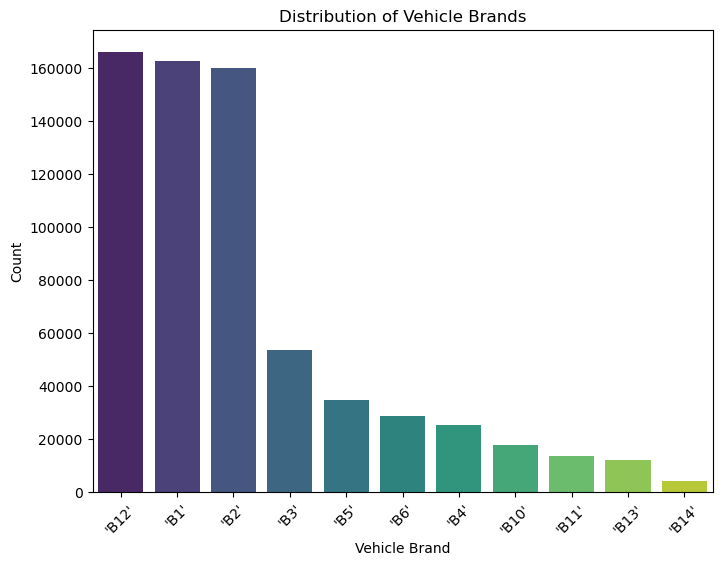

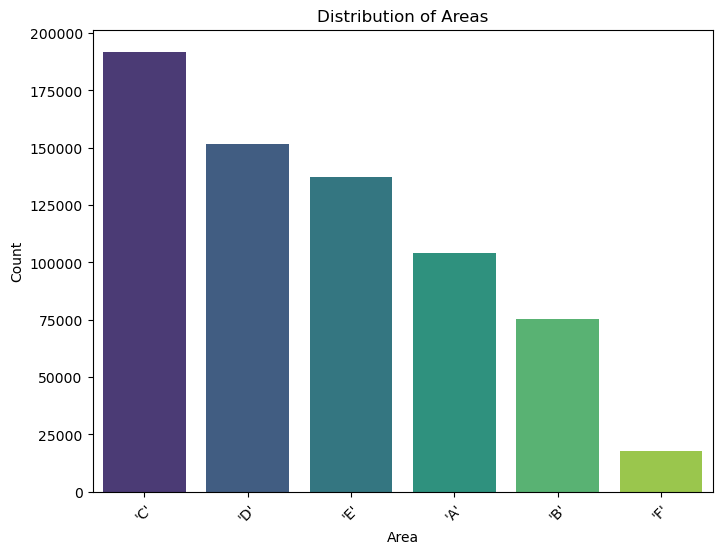

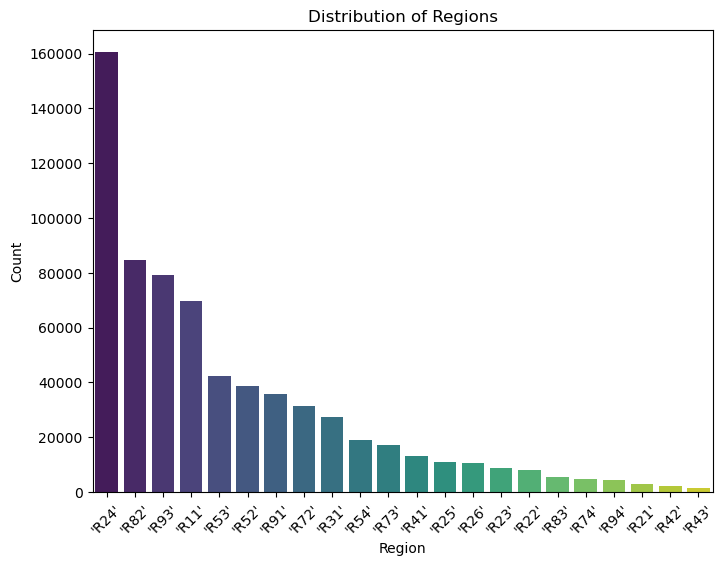

In [54]:
vehbrand_order = aggregated_data['VehBrand'].value_counts().index

plt.figure(figsize=(8, 6))
sns.countplot(x='VehBrand', data=aggregated_data, palette='viridis', order=vehbrand_order)
plt.title('Distribution of Vehicle Brands')
plt.xlabel('Vehicle Brand')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.show()

# Sort the categories by count in descending order for Area
area_order = aggregated_data['Area'].value_counts().index

plt.figure(figsize=(8, 6))
sns.countplot(x='Area', data=aggregated_data, palette='viridis', order=area_order)
plt.title('Distribution of Areas')
plt.xlabel('Area')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.show()

region_order = aggregated_data['Region'].value_counts().index

plt.figure(figsize=(8, 6))
sns.countplot(x='Region', data=aggregated_data, palette='viridis', order=region_order)
plt.title('Distribution of Regions')
plt.xlabel('Region')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.show()

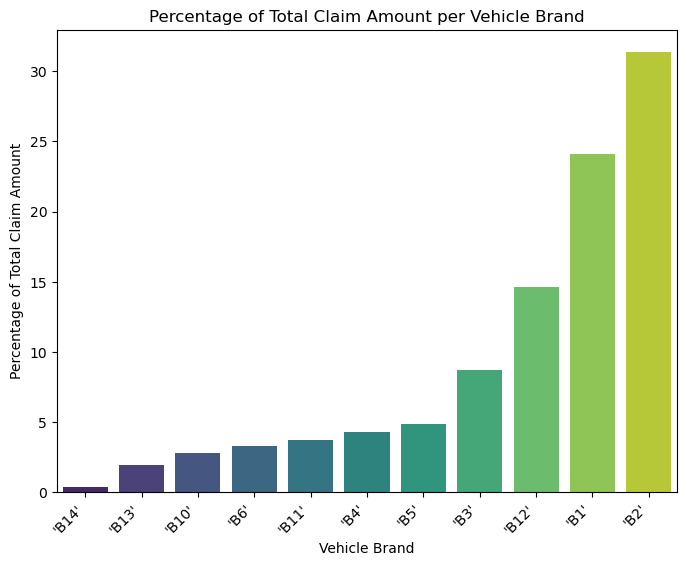

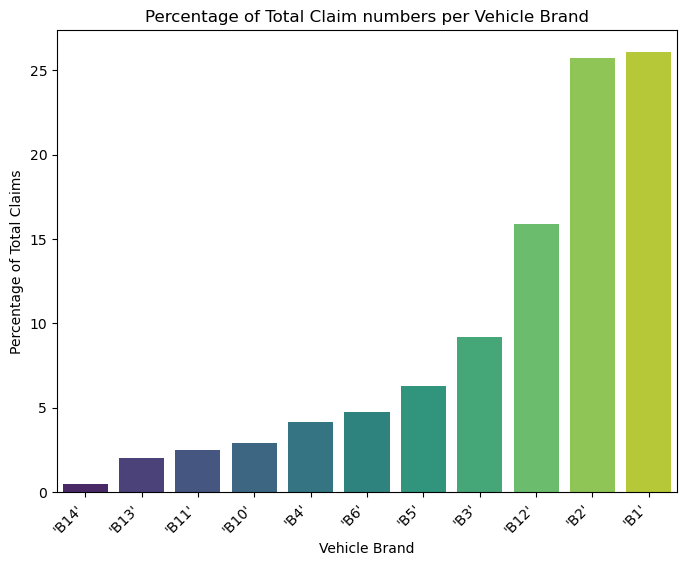

In [55]:
filtered_data = aggregated_data[aggregated_data['ClaimNb'] > 0]

# Group by VehBrand and aggregate the data
brand_claims = filtered_data.groupby('VehBrand').agg(
    total_claim_amount=('ClaimAmount', 'sum'),
    total_claim_nb=('ClaimNb', 'sum')
).reset_index()

# Calculate the total claim amount and percentage
total_claim_amount = brand_claims['total_claim_amount'].sum()
brand_claims['Percentage_ClaimAmount'] = (brand_claims['total_claim_amount'] / total_claim_amount) * 100

# Calculate the total claim number and percentage
total_claim_nb = brand_claims['total_claim_nb'].sum()
brand_claims['Percentage_ClaimNb'] = (brand_claims['total_claim_nb'] / total_claim_nb) * 100

# Sort the data by total claim amount
brand_claims = brand_claims.sort_values(by='total_claim_amount')

# Plot the percentage of total claim amount per vehicle brand
plt.figure(figsize=(8, 6))
sns.barplot(x='VehBrand', y='Percentage_ClaimAmount', data=brand_claims, palette='viridis')
plt.title('Percentage of Total Claim Amount per Vehicle Brand')
plt.xlabel('Vehicle Brand')
plt.ylabel('Percentage of Total Claim Amount')
plt.xticks(rotation=45, ha='right')
plt.show()

# Sort the data by total claim number
brand_claims = brand_claims.sort_values(by='total_claim_nb')

# Plot the percentage of total claims per vehicle brand
plt.figure(figsize=(8, 6))
sns.barplot(x='VehBrand', y='Percentage_ClaimNb', data=brand_claims, palette='viridis')
plt.title('Percentage of Total Claim numbers per Vehicle Brand')
plt.xlabel('Vehicle Brand')
plt.ylabel('Percentage of Total Claims')
plt.xticks(rotation=45, ha='right')
plt.show()


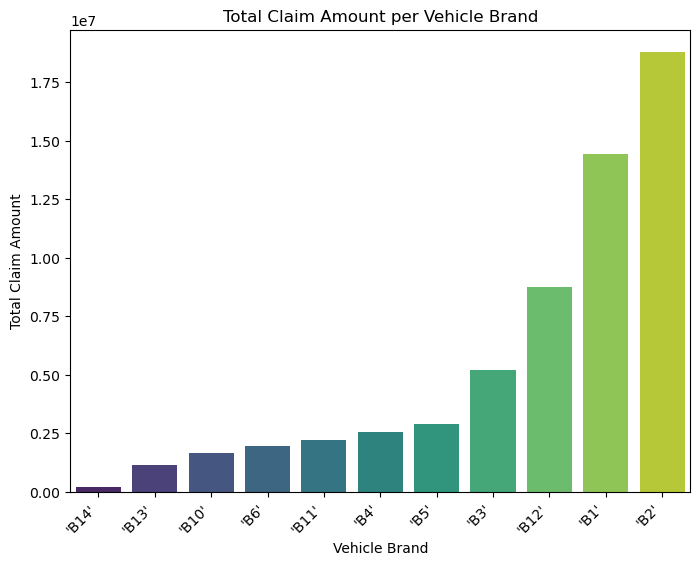

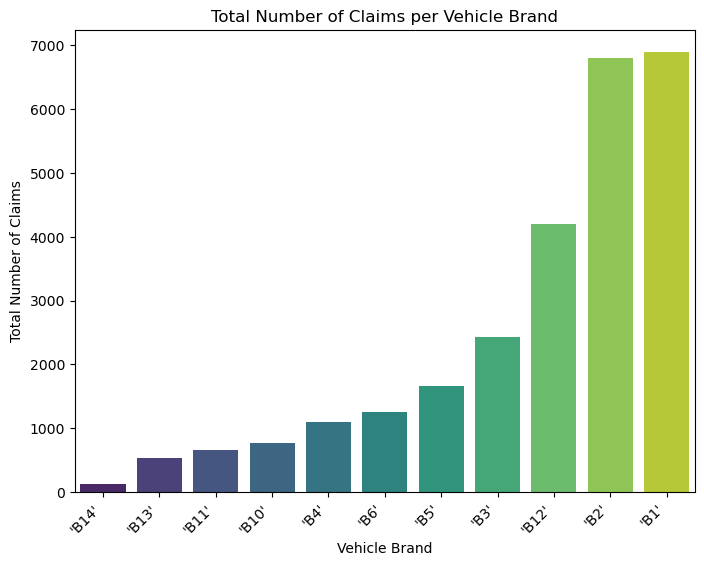

In [56]:
brand_claims = brand_claims.sort_values(by='total_claim_amount', ascending=True)

plt.figure(figsize=(8, 6))
sns.barplot(x='VehBrand', y='total_claim_amount', data=brand_claims, palette='viridis')
plt.title('Total Claim Amount per Vehicle Brand')
plt.xlabel('Vehicle Brand')
plt.ylabel('Total Claim Amount')
plt.xticks(rotation=45, ha='right')
plt.show()

# Sort the data by total claim number in ascending order
brand_claims = brand_claims.sort_values(by='total_claim_nb', ascending=True)

# Plot the total number of claims per vehicle brand
plt.figure(figsize=(8, 6))
sns.barplot(x='VehBrand', y='total_claim_nb', data=brand_claims, palette='viridis')
plt.title('Total Number of Claims per Vehicle Brand')
plt.xlabel('Vehicle Brand')
plt.ylabel('Total Number of Claims')
plt.xticks(rotation=45, ha='right')
plt.show()

#### Log scale 

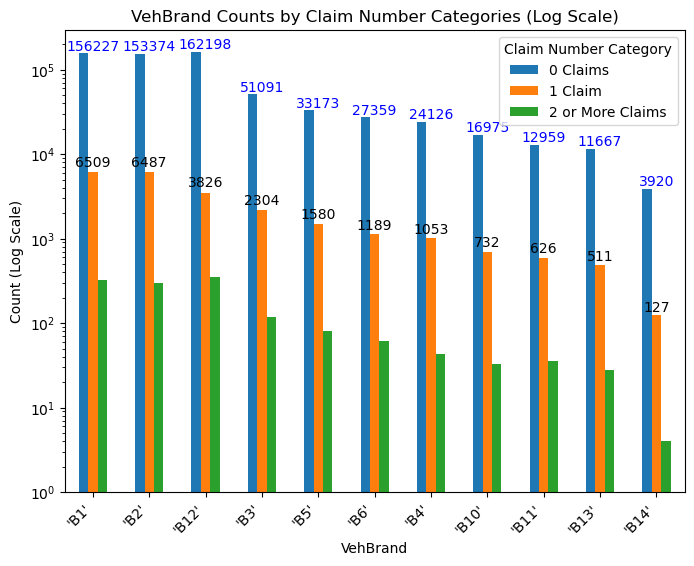

In [57]:
def categorize_claim_nb(claim_nb):
    if claim_nb == 0:
        return '0 Claims'
    elif claim_nb == 1:
        return '1 Claim'
    elif claim_nb >= 2:
        return '2 or More Claims'
    else:
        return None

aggregated_data['ClaimNbCategory'] = aggregated_data['ClaimNb'].apply(categorize_claim_nb)

filtered_data = aggregated_data[aggregated_data['ClaimNbCategory'].notnull()]

grouped_data = filtered_data.groupby(['ClaimNbCategory', 'VehBrand']).size().reset_index(name='Count')

pivot_data = grouped_data.pivot(index='VehBrand', columns='ClaimNbCategory', values='Count').fillna(0)

pivot_data['Total Claims'] = pivot_data[['1 Claim', '2 or More Claims']].sum(axis=1)

# Sort the pivot_data by Total Claims in descending order
pivot_data = pivot_data.sort_values(by='Total Claims', ascending=False)

ax = pivot_data.drop(columns='Total Claims').plot(kind='bar', figsize=(8, 6), log=True)
plt.title('VehBrand Counts by Claim Number Categories (Log Scale)')
plt.xlabel('VehBrand')
plt.ylabel('Count (Log Scale)')
plt.legend(title='Claim Number Category')

plt.xticks(rotation=45, ha='right')

for i, total in enumerate(pivot_data['Total Claims']):
    ax.text(i, total, f'{int(total)}', ha='center', va='bottom', fontsize=10, color='black', rotation=0)

for i, value in enumerate(pivot_data['0 Claims']):
    ax.text(i, value, f'{int(value)}', ha='center', va='bottom', fontsize=10, color='blue', rotation=0)

plt.show()

In [58]:
import pandas as pd
import plotly.graph_objects as go

# Assuming aggregated_data is already defined and loaded

def categorize_claim_nb(claim_nb):
    if claim_nb == 0:
        return '0 Claims'
    elif claim_nb == 1:
        return '1 Claim'
    elif claim_nb >= 2:
        return '2 or More Claims'
    else:
        return None

# Apply categorization
aggregated_data['ClaimNbCategory'] = aggregated_data['ClaimNb'].apply(categorize_claim_nb)

# Group and pivot data
grouped_data = aggregated_data.groupby(['ClaimNbCategory', 'VehBrand']).size().reset_index(name='Count')
pivot_data = grouped_data.pivot(index='VehBrand', columns='ClaimNbCategory', values='Count').fillna(0)

# Add a column for total claims and sort by total claims in decreasing order
pivot_data['Total Claims'] = pivot_data[['1 Claim', '2 or More Claims']].sum(axis=1)
pivot_data = pivot_data.sort_values(by='Total Claims', ascending=False)

# Create Plotly bar chart
fig = go.Figure()

# Add bars for each claim category
for category in ['0 Claims', '1 Claim', '2 or More Claims']:
    fig.add_trace(go.Bar(
        x=pivot_data.index,
        y=pivot_data[category],
        name=category,
        text=pivot_data[category].astype(int),  # Display actual counts
        textposition='outside'
    ))

# Update layout
fig.update_layout(
    title='VehBrand Counts by Claim Number Categories',
    xaxis_title='VehBrand',
    yaxis_title='Count',
    barmode='group',  # Group bars together
    legend_title='Claim Number Category'
)

# Rotate x-axis labels
fig.update_xaxes(tickangle=45)

fig.show()

In [59]:
import numpy as np
import plotly.graph_objects as go

# Assuming aggregated_data is already defined and loaded

def categorize_claim_nb(claim_nb):
    if claim_nb == 0:
        return '0 Claims'
    elif claim_nb == 1:
        return '1 Claim'
    elif claim_nb >= 2:
        return '2 or More Claims'
    else:
        return None

# Apply categorization
aggregated_data['ClaimNbCategory'] = aggregated_data['ClaimNb'].apply(categorize_claim_nb)

# Group and pivot data
grouped_data = aggregated_data.groupby(['ClaimNbCategory', 'VehBrand']).size().reset_index(name='Count')
pivot_data = grouped_data.pivot(index='VehBrand', columns='ClaimNbCategory', values='Count').fillna(0)

# Add a column for total claims and sort by total claims in decreasing order
pivot_data['Total Claims'] = pivot_data[['1 Claim', '2 or More Claims']].sum(axis=1)
pivot_data = pivot_data.sort_values(by='Total Claims', ascending=False)

# Apply log transformation to counts
pivot_data_log = pivot_data.applymap(lambda x: np.log10(x + 1))  # Adding 1 to avoid log(0)

# Create Plotly bar chart
fig = go.Figure()

# Add bars for each claim category
for category in ['0 Claims', '1 Claim', '2 or More Claims']:
    fig.add_trace(go.Bar(
        x=pivot_data_log.index,
        y=pivot_data_log[category],
        name=category,
        text=pivot_data[category].astype(int),  # Display original counts
        textposition='outside'
    ))

# Update layout
fig.update_layout(
    title='VehBrand Counts by Claim Number Categories (Log Transformed)',
    xaxis_title='VehBrand',
    yaxis_title='Log10(Count + 1)',
    barmode='group',  # Group bars together
    legend_title='Claim Number Category'
)

# Rotate x-axis labels
fig.update_xaxes(tickangle=45)

fig.show()

In [60]:
import plotly.graph_objects as go

# Assuming aggregated_data is already defined and loaded

def categorize_claim_nb(claim_nb):
    if claim_nb == 0:
        return '0 Claims'
    elif claim_nb == 1:
        return '1 Claim'
    elif claim_nb >= 2:
        return '2 or More Claims'
    else:
        return None

# Apply categorization
aggregated_data['ClaimNbCategory'] = aggregated_data['ClaimNb'].apply(categorize_claim_nb)

# Group and pivot data
grouped_data = aggregated_data.groupby(['ClaimNbCategory', 'VehBrand']).size().reset_index(name='Count')
pivot_data = grouped_data.pivot(index='VehBrand', columns='ClaimNbCategory', values='Count').fillna(0)

# Add a column for total claims and sort by total claims in decreasing order
pivot_data['Total Claims'] = pivot_data[['1 Claim', '2 or More Claims']].sum(axis=1)
pivot_data = pivot_data.sort_values(by='Total Claims', ascending=False)

# Apply log transformation to counts
pivot_data_log = pivot_data.applymap(lambda x: np.log10(x + 1))  # Adding 1 to avoid log(0)

# Create Plotly bar chart with color shades of #ff9999
fig = go.Figure()

# Define color shades for each category
colors = {
    '0 Claims': '#ff6666',  # Original color
    '1 Claim': '#ff9999',   # Darker shade
    '2 or More Claims': '#ffcccc'  # Lighter shade
}

# Add bars for each claim category
for category in ['0 Claims', '1 Claim', '2 or More Claims']:
    fig.add_trace(go.Bar(
        x=pivot_data_log.index,
        y=pivot_data_log[category],
        name=category,
        text=pivot_data[category].astype(int),  # Display original counts
        textposition='outside',
        marker=dict(color=colors[category])  # Set color shade
    ))

# Update layout
fig.update_layout(
    title='VehBrand Counts by Claim Number Categories (Log Transformed)',
    xaxis_title='VehBrand',
    yaxis_title='Log10(Count + 1)',
    barmode='group',  # Group bars together
    legend_title='Claim Number Category',
    paper_bgcolor='#2b2b2b',  # Darker grey background
    plot_bgcolor='#2b2b2b',   # Darker grey plot area
    font=dict(color='white')  # Set font color to white
)

# Rotate x-axis labels
fig.update_xaxes(tickangle=45)

fig.show()

In [61]:

def categorize_claim_nb(claim_nb):
    if claim_nb == 0:
        return '0 Claims'
    elif claim_nb == 1:
        return '1 Claim'
    elif claim_nb >= 2:
        return '2 or More Claims'
    else:
        return None

# Apply categorization
aggregated_data['ClaimNbCategory'] = aggregated_data['ClaimNb'].apply(categorize_claim_nb)

# Group and pivot data
grouped_data = aggregated_data.groupby(['ClaimNbCategory', 'VehBrand']).size().reset_index(name='Count')
pivot_data = grouped_data.pivot(index='VehBrand', columns='ClaimNbCategory', values='Count').fillna(0)

# Add a column for total claims and sort by total claims in decreasing order
pivot_data['Total Claims'] = pivot_data[['1 Claim', '2 or More Claims']].sum(axis=1)
pivot_data = pivot_data.sort_values(by='Total Claims', ascending=False)

# Apply log transformation to counts
pivot_data_log = pivot_data.applymap(lambda x: np.log10(x + 1))  # Adding 1 to avoid log(0)

# Debug: Print the columns of pivot_data_log
print("Columns in pivot_data_log:", pivot_data_log.columns)

Columns in pivot_data_log: Index(['0 Claims', '1 Claim', '2 or More Claims', 'Total Claims'], dtype='object', name='ClaimNbCategory')


In [62]:
import numpy as np
import plotly.graph_objects as go

# Assuming aggregated_data is already defined and loaded

def categorize_claim_nb(claim_nb):
    if claim_nb == 0:
        return '0 Claims'
    elif claim_nb == 1:
        return '1 Claim'
    elif claim_nb >= 2:
        return '2 or More Claims'
    else:
        return None

# Apply categorization
aggregated_data['ClaimNbCategory'] = aggregated_data['ClaimNb'].apply(categorize_claim_nb)

# Group and pivot data
grouped_data = aggregated_data.groupby(['ClaimNbCategory', 'VehBrand']).size().reset_index(name='Count')
pivot_data = grouped_data.pivot(index='VehBrand', columns='ClaimNbCategory', values='Count').fillna(0)

# Add a column for total claims and sort by total claims in decreasing order
pivot_data['Total Claims'] = pivot_data[['1 Claim', '2 or More Claims']].sum(axis=1)
pivot_data = pivot_data.sort_values(by='Total Claims', ascending=False)

# Apply log transformation to counts
pivot_data_log = pivot_data.applymap(lambda x: np.log10(x + 1))  # Adding 1 to avoid log(0)

# Create Plotly bar chart with shades of turquoise
fig = go.Figure()

# Define shades of turquoise for each category
colors = {
    '0 Claims': '#40E0D0',  # Original turquoise
    '1 Claim': '#48D1CC',   # Slightly darker shade
    '2 or More Claims': '#AFEEEE'  # Lighter shade
}

# Add bars for each claim category
for category in ['0 Claims', '1 Claim', '2 or More Claims']:
    fig.add_trace(go.Bar(
        x=pivot_data_log.index,
        y=pivot_data_log[category],
        name=category,
        text=pivot_data[category].astype(int),  # Display original counts
        textposition='outside',
        marker=dict(color=colors[category])  # Set turquoise shade
    ))

# Update layout
fig.update_layout(
    title='VehBrand Counts by Claim Number Categories (Log Transformed)',
    xaxis_title='VehBrand',
    yaxis_title='Log10(Count + 1)',
    barmode='group',  # Group bars together
    legend_title='Claim Number Category',
    plot_bgcolor='black',  # Set plot background to black
    paper_bgcolor='black',  # Set paper background to black,
    font=dict(color='white')  # Set font color to white for better contrast
)

# Rotate x-axis labels
fig.update_xaxes(tickangle=45)

fig.show()

In [63]:
import numpy as np
import plotly.graph_objects as go

# Assuming aggregated_data is already defined and loaded

def categorize_claim_nb(claim_nb):
    if claim_nb == 0:
        return '0 Claims'
    elif claim_nb == 1:
        return '1 Claim'
    elif claim_nb >= 2:
        return '2 or More Claims'
    else:
        return None

# Apply categorization
aggregated_data['ClaimNbCategory'] = aggregated_data['ClaimNb'].apply(categorize_claim_nb)

# Group and pivot data
grouped_data = aggregated_data.groupby(['ClaimNbCategory', 'VehBrand']).size().reset_index(name='Count')
pivot_data = grouped_data.pivot(index='VehBrand', columns='ClaimNbCategory', values='Count').fillna(0)

# Add a column for total claims and sort by total claims in decreasing order
pivot_data['Total Claims'] = pivot_data[['1 Claim', '2 or More Claims']].sum(axis=1)
pivot_data = pivot_data.sort_values(by='Total Claims', ascending=False)

# Apply log transformation to counts
pivot_data_log = pivot_data.applymap(lambda x: np.log10(x + 1))  # Adding 1 to avoid log(0)

# Create Plotly bar chart with shades of turquoise
fig = go.Figure()

# Define shades of turquoise for each category
colors = {
    '0 Claims': '#40E0D0',  # Original turquoise
    '1 Claim': '#48D1CC',   # Slightly darker shade
    '2 or More Claims': '#AFEEEE'  # Lighter shade
}

# Add bars for each claim category
for category in ['0 Claims', '1 Claim', '2 or More Claims']:
    fig.add_trace(go.Bar(
        x=pivot_data_log.index,
        y=pivot_data_log[category],
        name=category,
        text=pivot_data[category].astype(int),  # Display original counts
        textposition='outside',
        marker=dict(color=colors[category])  # Set turquoise shade
    ))

# Update layout
fig.update_layout(
    title='VehBrand Counts by Claim Number Categories (Log Transformed)',
    xaxis_title='VehBrand',
    yaxis_title='Log10(Count + 1)',
    barmode='group',  # Group bars together
    legend_title='Claim Number Category',
    plot_bgcolor='#2b2b2b',  # Set plot background to darker grey
    paper_bgcolor='#2b2b2b',  # Set paper background to darker grey
    font=dict(color='white')  # Set font color to white for better contrast
)

# Rotate x-axis labels
fig.update_xaxes(tickangle=45)

fig.show()

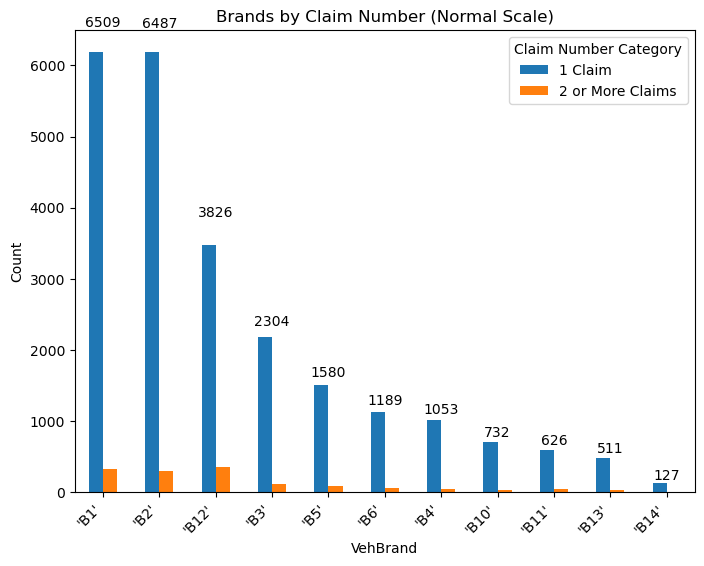

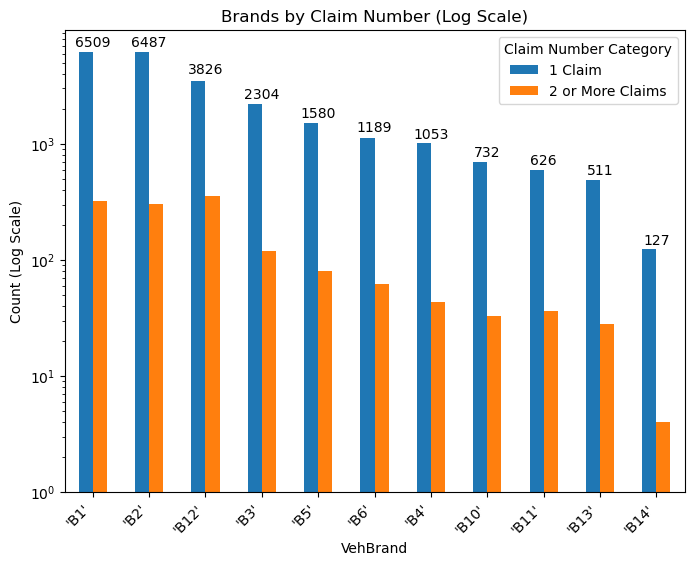

In [64]:
def categorize_claim_nb(claim_nb):
    if claim_nb == 1:
        return '1 Claim'
    elif claim_nb >= 2:
        return '2 or More Claims'
    else:
        return None

# Apply the categorization function
aggregated_data['ClaimNbCategory'] = aggregated_data['ClaimNb'].apply(categorize_claim_nb)

# Filter out rows where ClaimNbCategory is None
filtered_data = aggregated_data[aggregated_data['ClaimNbCategory'].notnull()]

# Group by the new category and VehBrand
grouped_data = filtered_data.groupby(['ClaimNbCategory', 'VehBrand']).size().reset_index(name='Count')

# Pivot the data for plotting
pivot_data = grouped_data.pivot(index='VehBrand', columns='ClaimNbCategory', values='Count').fillna(0)

# Calculate total claims per VehBrand
pivot_data['Total Claims'] = pivot_data[['1 Claim', '2 or More Claims']].sum(axis=1)

# Sort the data by Total Claims in descending order
pivot_data = pivot_data.sort_values(by='Total Claims', ascending=False)

# Plot the results with a normal scale
ax_normal = pivot_data.drop(columns='Total Claims').plot(kind='bar', figsize=(8, 6))
plt.title('Brands by Claim Number (Normal Scale)')
plt.xlabel('VehBrand')
plt.ylabel('Count')
plt.legend(title='Claim Number Category')

# Tilt the x-axis labels
plt.xticks(rotation=45, ha='right')

# Annotate total claims for each VehBrand
for i, total in enumerate(pivot_data['Total Claims']):
    ax_normal.text(i, total, f'{int(total)}', ha='center', va='bottom', fontsize=10, color='black', rotation=0)

plt.show()

# Plot the results with a logarithmic scale
ax_log = pivot_data.drop(columns='Total Claims').plot(kind='bar', figsize=(8, 6), log=True)
plt.title('Brands by Claim Number (Log Scale)')
plt.xlabel('VehBrand')
plt.ylabel('Count (Log Scale)')
plt.legend(title='Claim Number Category')

# Tilt the x-axis labels
plt.xticks(rotation=45, ha='right')

# Annotate total claims for each VehBrand
for i, total in enumerate(pivot_data['Total Claims']):
    ax_log.text(i, total, f'{int(total)}', ha='center', va='bottom', fontsize=10, color='black', rotation=0)

plt.show()

In [65]:
import plotly.graph_objects as go

# Define the categorization function
def categorize_claim_nb(claim_nb):
    if claim_nb == 1:
        return '1 Claim'
    elif claim_nb >= 2:
        return '2 or More Claims'
    else:
        return None

# Apply the categorization function
aggregated_data['ClaimNbCategory'] = aggregated_data['ClaimNb'].apply(categorize_claim_nb)

# Filter out rows where ClaimNbCategory is None
filtered_data = aggregated_data[aggregated_data['ClaimNbCategory'].notnull()]

# Group by the new category and VehBrand
grouped_data = filtered_data.groupby(['ClaimNbCategory', 'VehBrand']).size().reset_index(name='Count')

# Pivot the data for plotting
pivot_data = grouped_data.pivot(index='VehBrand', columns='ClaimNbCategory', values='Count').fillna(0)

# Calculate total claims per VehBrand
pivot_data['Total Claims'] = pivot_data[['1 Claim', '2 or More Claims']].sum(axis=1)

# Sort the data by Total Claims in descending order
pivot_data = pivot_data.sort_values(by='Total Claims', ascending=False)

# Apply log transformation to counts
pivot_data_log = pivot_data.applymap(lambda x: np.log10(x + 1))  # Adding 1 to avoid log(0)

# Create Plotly bar chart with shades of turquoise
fig = go.Figure()

# Define shades of turquoise for each category
colors = {
    '1 Claim': '#48D1CC',   # Slightly darker shade
    '2 or More Claims': '#AFEEEE'  # Lighter shade
}

# Add bars for each claim category
for category in ['1 Claim', '2 or More Claims']:
    fig.add_trace(go.Bar(
        x=pivot_data_log.index,
        y=pivot_data_log[category],
        name=category,
        text=pivot_data[category].astype(int),  # Display original counts
        textposition='outside',
        marker=dict(color=colors[category])  # Set turquoise shade
    ))

# Update layout
fig.update_layout(
    title='VehBrand Counts by Claim Number Categories (Log Transformed)',
    xaxis_title='VehBrand',
    yaxis_title='Log10(Count + 1)',
    barmode='group',  # Group bars together
    legend_title='Claim Number Category',
    plot_bgcolor='#2b2b2b',  # Set plot background to darker grey
    paper_bgcolor='#2b2b2b',  # Set paper background to darker grey
    font=dict(color='white')  # Set font color to white for better contrast
)

# Rotate x-axis labels
fig.update_xaxes(tickangle=45)

fig.show()


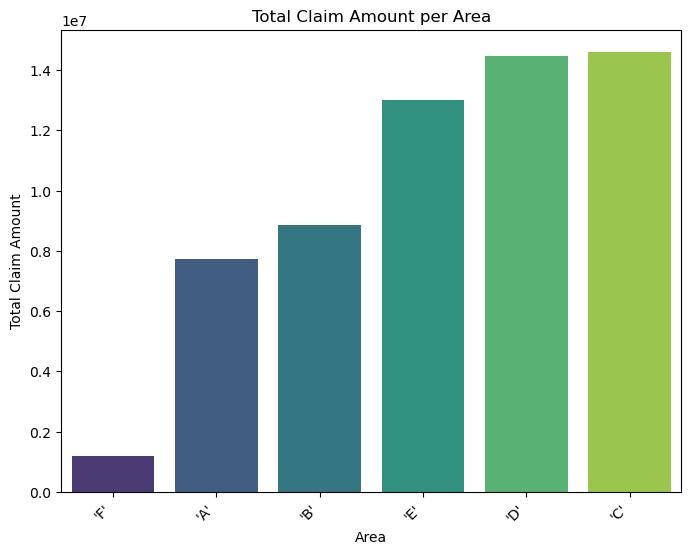

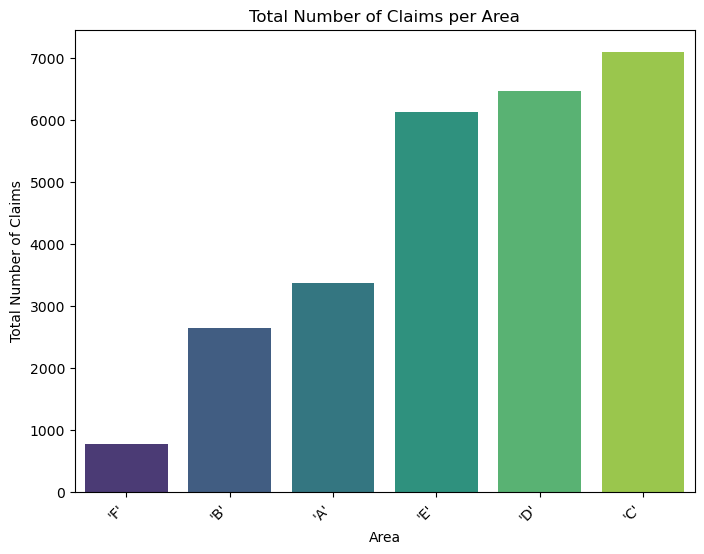

In [66]:
area_claims = filtered_data.groupby('Area').agg(
    total_claim_amount=('ClaimAmount', 'sum'),
    total_claim_nb=('ClaimNb', 'sum')
).reset_index()

# Sort the data by total claim amount
area_claims = area_claims.sort_values(by='total_claim_amount')

# Plot the total claim amount per area with vertical bars
plt.figure(figsize=(8, 6))
sns.barplot(x='Area', y='total_claim_amount', data=area_claims, palette='viridis')
plt.title('Total Claim Amount per Area')
plt.xlabel('Area')
plt.ylabel('Total Claim Amount')
plt.xticks(rotation=45, ha='right')
plt.show()

# Sort the data by total claim number
area_claims = area_claims.sort_values(by='total_claim_nb')

# Plot the total number of claims per area with vertical bars
plt.figure(figsize=(8, 6))
sns.barplot(x='Area', y='total_claim_nb', data=area_claims, palette='viridis')
plt.title('Total Number of Claims per Area')
plt.xlabel('Area')
plt.ylabel('Total Number of Claims')
plt.xticks(rotation=45, ha='right')
plt.show()

In [67]:
area_claims["total_claim_amount"].sum()

59909216.5

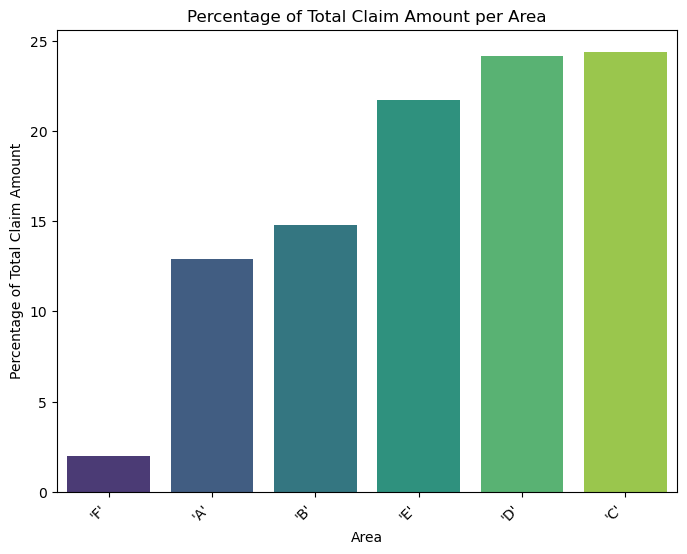

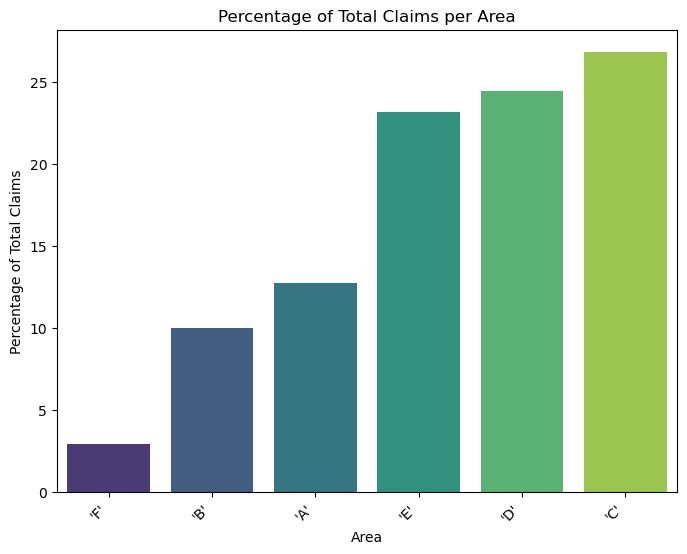

In [68]:
total_claim_amount = area_claims['total_claim_amount'].sum()
area_claims['Percentage_ClaimAmount'] = (area_claims['total_claim_amount'] / total_claim_amount) * 100

# Calculate the total claim number and percentage
total_claim_nb = area_claims['total_claim_nb'].sum()
area_claims['Percentage_ClaimNb'] = (area_claims['total_claim_nb'] / total_claim_nb) * 100

# Sort the data by total claim amount
area_claims = area_claims.sort_values(by='total_claim_amount')

# Plot the percentage of total claim amount per area with vertical bars
plt.figure(figsize=(8, 6))
sns.barplot(x='Area', y='Percentage_ClaimAmount', data=area_claims, palette='viridis')
plt.title('Percentage of Total Claim Amount per Area')
plt.xlabel('Area')
plt.ylabel('Percentage of Total Claim Amount')
plt.xticks(rotation=45, ha='right')
plt.show()

# Sort the data by total claim number
area_claims = area_claims.sort_values(by='total_claim_nb')

# Plot the percentage of total claims per area with vertical bars
plt.figure(figsize=(8, 6))
sns.barplot(x='Area', y='Percentage_ClaimNb', data=area_claims, palette='viridis')
plt.title('Percentage of Total Claims per Area')
plt.xlabel('Area')
plt.ylabel('Percentage of Total Claims')
plt.xticks(rotation=45, ha='right')
plt.show()

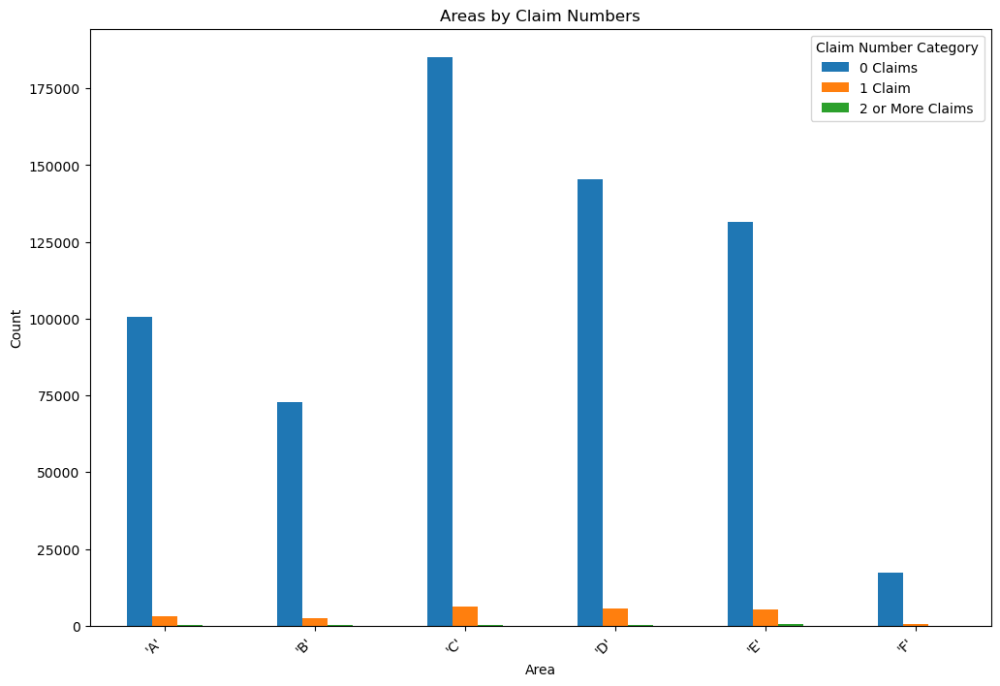

In [69]:
def categorize_claim_nb(claim_nb):
    if claim_nb == 0:
        return '0 Claims'
    elif claim_nb == 1:
        return '1 Claim'
    else:
        return '2 or More Claims'


aggregated_data['ClaimNbCategory'] = aggregated_data['ClaimNb'].apply(categorize_claim_nb)
grouped_data = aggregated_data.groupby(['ClaimNbCategory', 'Area']).size().reset_index(name='Count')
pivot_data = grouped_data.pivot(index='Area', columns='ClaimNbCategory', values='Count').fillna(0)

ax = pivot_data.plot(kind='bar', figsize=(12, 8))
plt.title('Areas by Claim Numbers')
plt.xlabel('Area')
plt.ylabel('Count')
plt.legend(title='Claim Number Category')

# Tilt the x-axis labels
plt.xticks(rotation=45, ha='right')

plt.show()

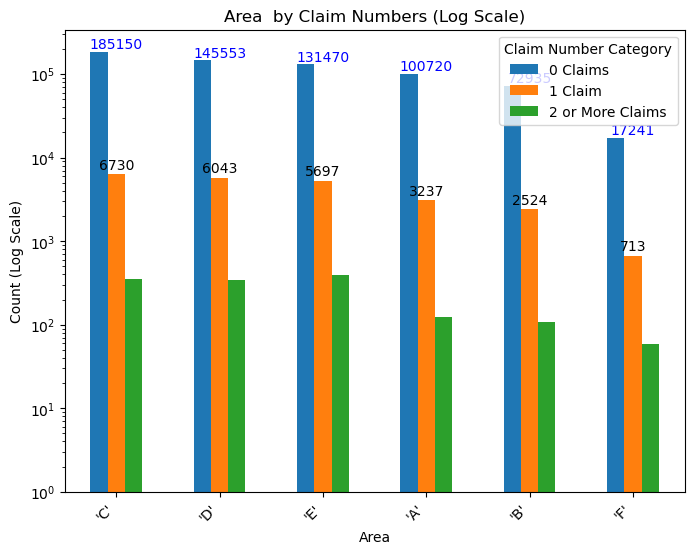

In [70]:
def categorize_claim_nb(claim_nb):
    if claim_nb == 0:
        return '0 Claims'
    elif claim_nb == 1:
        return '1 Claim'
    elif claim_nb >= 2:
        return '2 or More Claims'
    else:
        return None

aggregated_data['ClaimNbCategory'] = aggregated_data['ClaimNb'].apply(categorize_claim_nb)

filtered_data = aggregated_data[aggregated_data['ClaimNbCategory'].notnull()]

grouped_data = filtered_data.groupby(['ClaimNbCategory', 'Area']).size().reset_index(name='Count')

pivot_data = grouped_data.pivot(index='Area', columns='ClaimNbCategory', values='Count').fillna(0)

pivot_data['Total Claims'] = pivot_data[['1 Claim', '2 or More Claims']].sum(axis=1)

# Sort the pivot_data by Total Claims in descending order
pivot_data = pivot_data.sort_values(by='Total Claims', ascending=False)

ax = pivot_data.drop(columns='Total Claims').plot(kind='bar', figsize=(8, 6), log=True)
plt.title('Area  by Claim Numbers (Log Scale)')
plt.xlabel('Area')
plt.ylabel('Count (Log Scale)')
plt.legend(title='Claim Number Category')

plt.xticks(rotation=45, ha='right')

for i, total in enumerate(pivot_data['Total Claims']):
    ax.text(i, total, f'{int(total)}', ha='center', va='bottom', fontsize=10, color='black', rotation=0)

# Annotate the values on top of the highest blue bar (0 Claims)
for i, value in enumerate(pivot_data['0 Claims']):
    ax.text(i, value, f'{int(value)}', ha='center', va='bottom', fontsize=10, color='blue', rotation=0)

plt.show()

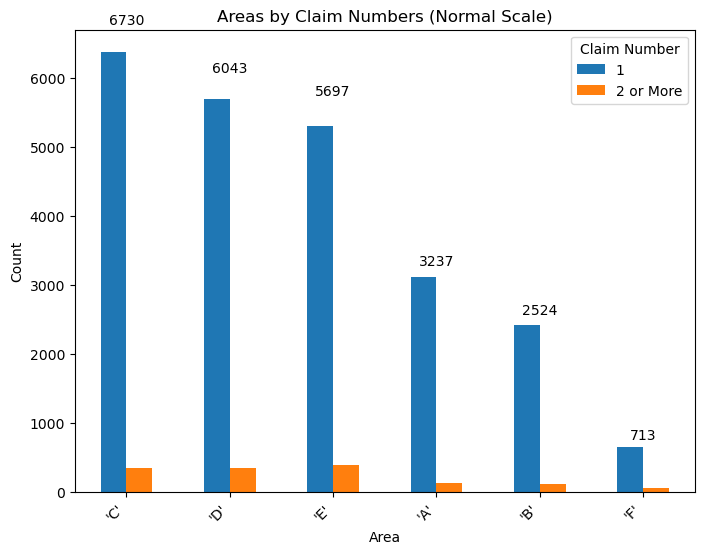

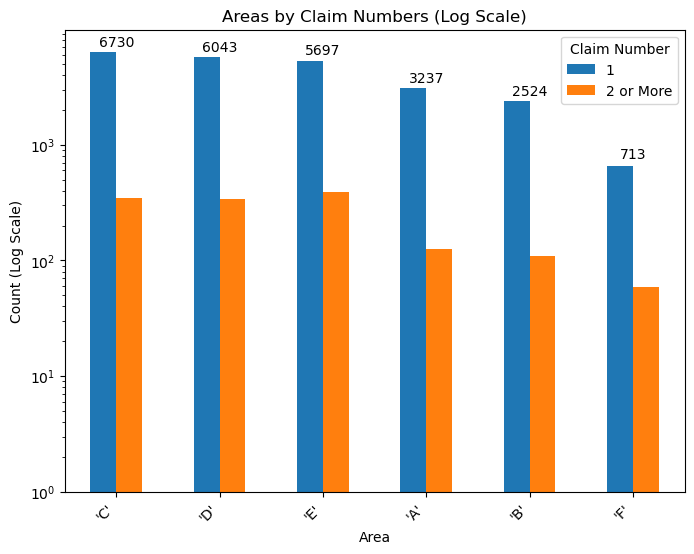

In [71]:
def categorize_claim_nb(claim_nb):
    if claim_nb == 1:
        return '1'
    elif claim_nb >= 2:
        return '2 or More'
    else:
        return None

# Apply the categorization function
aggregated_data['ClaimNbCategory'] = aggregated_data['ClaimNb'].apply(categorize_claim_nb)

# Filter out rows where ClaimNbCategory is None
filtered_data = aggregated_data[aggregated_data['ClaimNbCategory'].notnull()]

# Group by the new category and Area
grouped_data = filtered_data.groupby(['ClaimNbCategory', 'Area']).size().reset_index(name='Count')

# Pivot the data for plotting
pivot_data = grouped_data.pivot(index='Area', columns='ClaimNbCategory', values='Count').fillna(0)

# Calculate total claims per Area
pivot_data['Total Claims'] = pivot_data[['1', '2 or More']].sum(axis=1)

# Sort the data by Total Claims in descending order
pivot_data = pivot_data.sort_values(by='Total Claims', ascending=False)

# Plot the results with a normal scale
ax_normal = pivot_data.drop(columns='Total Claims').plot(kind='bar', figsize=(8, 6))
plt.title('Areas by Claim Numbers (Normal Scale)')
plt.xlabel('Area')
plt.ylabel('Count')
plt.legend(title='Claim Number')

# Tilt the x-axis labels
plt.xticks(rotation=45, ha='right')

# Annotate total claims for each Area
for i, total in enumerate(pivot_data['Total Claims']):
    ax_normal.text(i, total, f'{int(total)}', ha='center', va='bottom', fontsize=10, color='black', rotation=0)

plt.show()

# Plot the results with a logarithmic scale
ax_log = pivot_data.drop(columns='Total Claims').plot(kind='bar', figsize=(8, 6), log=True)
plt.title('Areas by Claim Numbers (Log Scale)')
plt.xlabel('Area')
plt.ylabel('Count (Log Scale)')
plt.legend(title='Claim Number')

# Tilt the x-axis labels
plt.xticks(rotation=45, ha='right')

# Annotate total claims for each Area
for i, total in enumerate(pivot_data['Total Claims']):
    ax_log.text(i, total, f'{int(total)}', ha='center', va='bottom', fontsize=10, color='black', rotation=0)

plt.show()

In [72]:
import plotly.express as px
import plotly.graph_objects as go

def categorize_claim_nb(claim_nb):
    if claim_nb == 1:
        return '1'
    elif claim_nb >= 2:
        return '2 or More'
    else:
        return None

# Apply the categorization function
aggregated_data['ClaimNbCategory'] = aggregated_data['ClaimNb'].apply(categorize_claim_nb)

# Filter out rows where ClaimNbCategory is None
filtered_data = aggregated_data[aggregated_data['ClaimNbCategory'].notnull()]

# Group by the new category and Area
grouped_data = filtered_data.groupby(['ClaimNbCategory', 'Area']).size().reset_index(name='Count')

# Pivot the data for plotting
pivot_data = grouped_data.pivot(index='Area', columns='ClaimNbCategory', values='Count').fillna(0)

# Calculate total claims per Area
pivot_data['Total Claims'] = pivot_data[['1', '2 or More']].sum(axis=1)

# Sort the data by Total Claims in descending order
pivot_data = pivot_data.sort_values(by='Total Claims', ascending=False)

# Convert the data to long format for Plotly
pivot_data_long = pivot_data.drop(columns='Total Claims').reset_index().melt(id_vars='Area', value_name='Count')

# Plot the results with a logarithmic scale using Plotly
fig_log = px.bar(pivot_data_long, x='Area', y='Count', color='ClaimNbCategory', log_y=True,
                 title='Areas by Claim Numbers (Log Scale)', labels={'Count': 'Count (Log Scale)'})
fig_log.update_layout(xaxis_title='Area', yaxis_title='Count (Log Scale)', barmode='group')
fig_log.show()


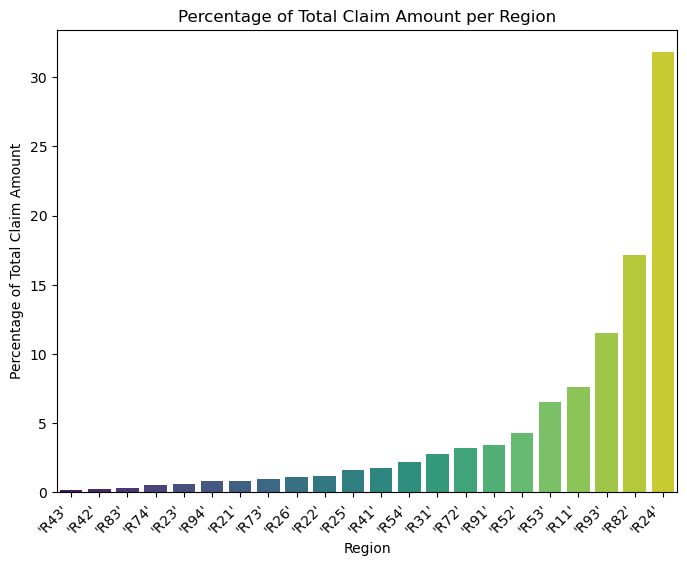

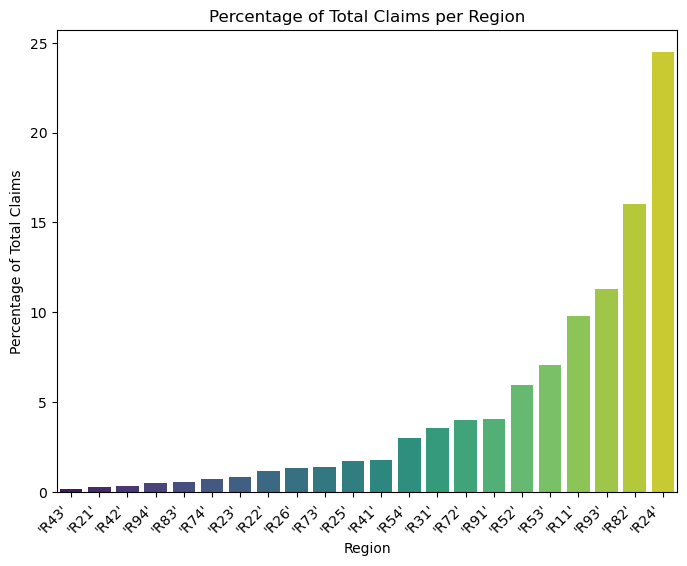

In [73]:
region_claims = filtered_data.groupby('Region').agg(
    total_claim_amount=('ClaimAmount', 'sum'),
    total_claim_nb=('ClaimNb', 'sum')
).reset_index()

# Calculate the total claim amount and percentage
total_claim_amount = region_claims['total_claim_amount'].sum()
region_claims['Percentage_ClaimAmount'] = (region_claims['total_claim_amount'] / total_claim_amount) * 100

# Calculate the total claim number and percentage
total_claim_nb = region_claims['total_claim_nb'].sum()
region_claims['Percentage_ClaimNb'] = (region_claims['total_claim_nb'] / total_claim_nb) * 100

# Sort the data by percentage of total claim amount
region_claims = region_claims.sort_values(by='Percentage_ClaimAmount')

# Plot the percentage of total claim amount per region with vertical bars
plt.figure(figsize=(8, 6))
sns.barplot(x='Region', y='Percentage_ClaimAmount', data=region_claims, palette='viridis')
plt.title('Percentage of Total Claim Amount per Region')
plt.xlabel('Region')
plt.ylabel('Percentage of Total Claim Amount')
plt.xticks(rotation=45, ha='right')
plt.show()

# Sort the data by percentage of total claim number
region_claims = region_claims.sort_values(by='Percentage_ClaimNb')

# Plot the percentage of total claims per region with vertical bars
plt.figure(figsize=(8, 6))
sns.barplot(x='Region', y='Percentage_ClaimNb', data=region_claims, palette='viridis')
plt.title('Percentage of Total Claims per Region')
plt.xlabel('Region')
plt.ylabel('Percentage of Total Claims')
plt.xticks(rotation=45, ha='right')
plt.show()

In [74]:
region_claims.head()

,Region,total_claim_amount,total_claim_nb,Percentage_ClaimAmount,Percentage_ClaimNb
10,'R43',76534.11,38,0.127750,0.143700
1,'R21',481248.34,77,0.803296,0.291181
9,'R42',121424.99,92,0.202682,0.347905
21,'R94',464582.55,132,0.775478,0.499168
18,'R83',183974.83,141,0.307089,0.533202


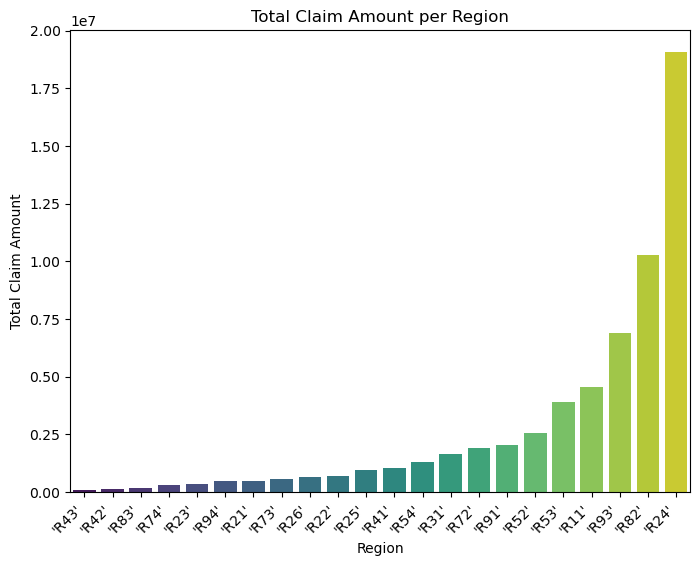

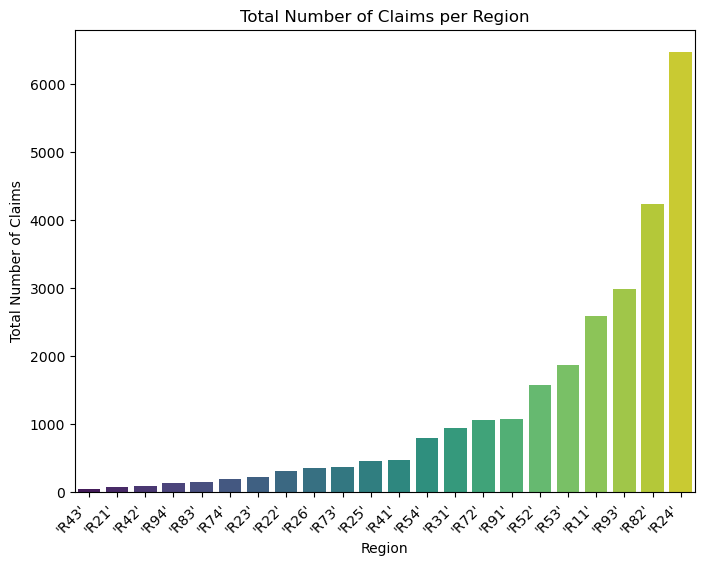

In [75]:
region_claims = region_claims.sort_values(by='total_claim_amount')

# Plot the total claim amount per region with vertical bars
plt.figure(figsize=(8, 6))
sns.barplot(x='Region', y='total_claim_amount', data=region_claims, palette='viridis')
plt.title('Total Claim Amount per Region')
plt.xlabel('Region')
plt.ylabel('Total Claim Amount')
plt.xticks(rotation=45, ha='right')
plt.show()

# Sort the data by total claim number
region_claims = region_claims.sort_values(by='total_claim_nb')

# Plot the total number of claims per region with vertical bars
plt.figure(figsize=(8, 6))
sns.barplot(x='Region', y='total_claim_nb', data=region_claims, palette='viridis')
plt.title('Total Number of Claims per Region')
plt.xlabel('Region')
plt.ylabel('Total Number of Claims')
plt.xticks(rotation=45, ha='right')
plt.show()

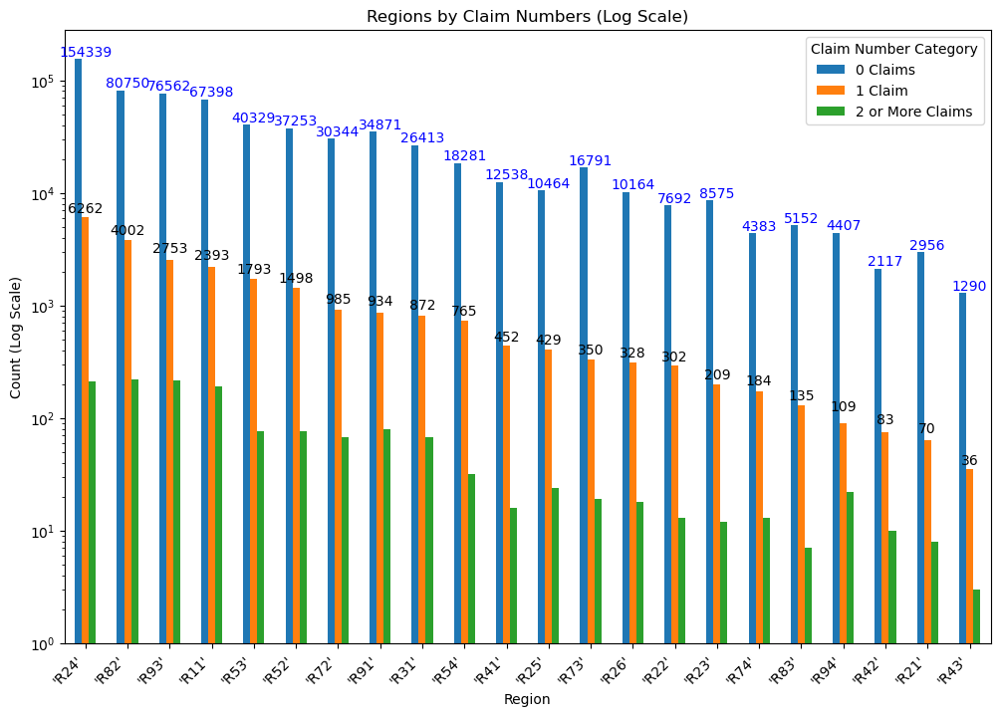

In [76]:
def categorize_claim_nb(claim_nb):
    if claim_nb == 0:
        return '0 Claims'
    elif claim_nb == 1:
        return '1 Claim'
    elif claim_nb >= 2:
        return '2 or More Claims'
    else:
        return None

# Apply the categorization function
aggregated_data['ClaimNbCategory'] = aggregated_data['ClaimNb'].apply(categorize_claim_nb)

# Filter out rows where ClaimNbCategory is None
filtered_data = aggregated_data[aggregated_data['ClaimNbCategory'].notnull()]

# Group by the new category and Region
grouped_data = filtered_data.groupby(['ClaimNbCategory', 'Region']).size().reset_index(name='Count')

# Pivot the data for plotting
pivot_data = grouped_data.pivot(index='Region', columns='ClaimNbCategory', values='Count').fillna(0)

# Calculate total claims per Region
pivot_data['Total Claims'] = pivot_data[['1 Claim', '2 or More Claims']].sum(axis=1)

# Sort the data by Total Claims in descending order
pivot_data = pivot_data.sort_values(by='Total Claims', ascending=False)

# Plot the results with a logarithmic scale
ax = pivot_data.drop(columns='Total Claims').plot(kind='bar', figsize=(12, 8), log=True)
plt.title('Regions by Claim Numbers (Log Scale)')
plt.xlabel('Region')
plt.ylabel('Count (Log Scale)')
plt.legend(title='Claim Number Category')

# Tilt the x-axis labels
plt.xticks(rotation=45, ha='right')

# Annotate total claims for each Region
for i, total in enumerate(pivot_data['Total Claims']):
    ax.text(i, total, f'{int(total)}', ha='center', va='bottom', fontsize=10, color='black', rotation=0)

# Annotate the values on top of the highest blue bar (0 Claims)
for i, value in enumerate(pivot_data['0 Claims']):
    ax.text(i, value, f'{int(value)}', ha='center', va='bottom', fontsize=10, color='blue', rotation=0)

plt.show()

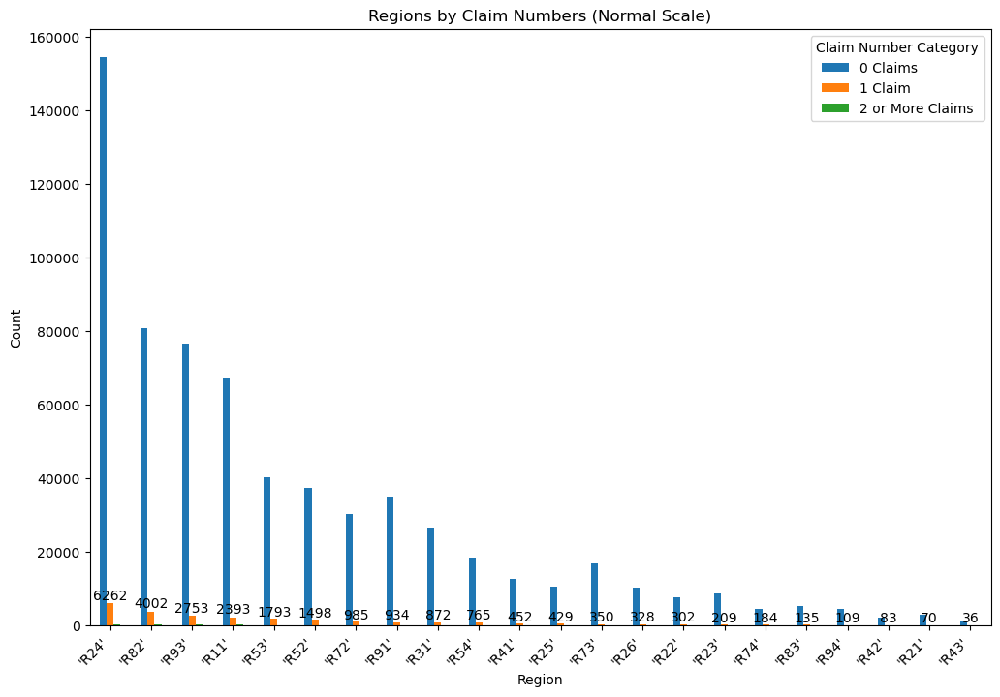

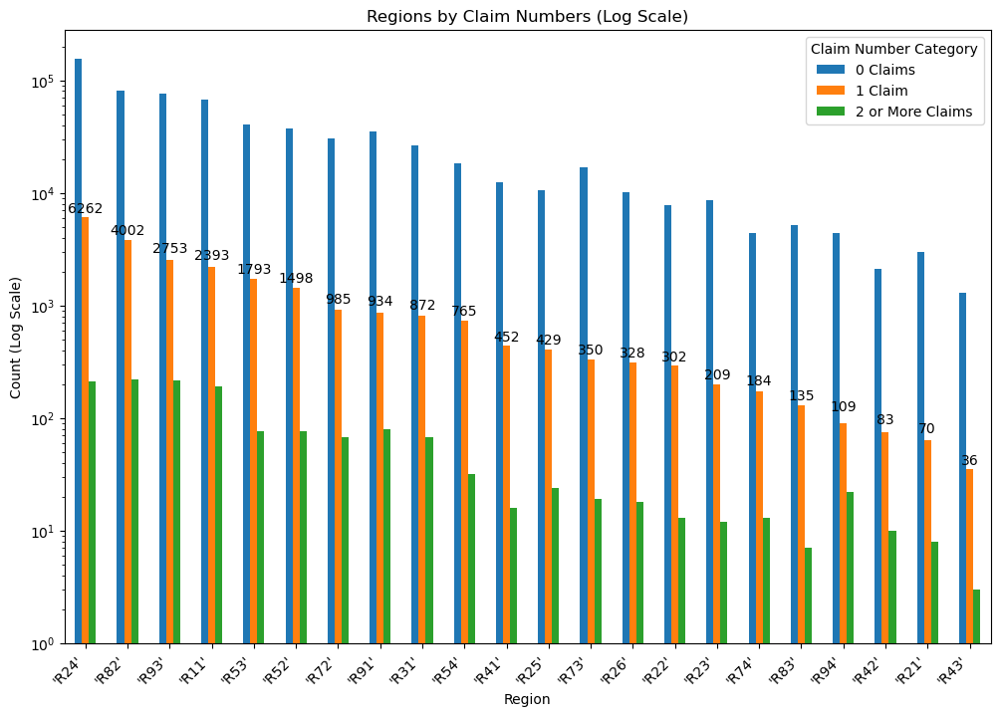

In [77]:
import pandas as pd
import matplotlib.pyplot as plt

# Assuming your DataFrame is named 'aggregated_data'


# Group by the new category and Region
grouped_data = filtered_data.groupby(['ClaimNbCategory', 'Region']).size().reset_index(name='Count')

# Pivot the data for plotting
pivot_data = grouped_data.pivot(index='Region', columns='ClaimNbCategory', values='Count').fillna(0)

# Calculate total claims per Region
pivot_data['Total Claims'] = pivot_data[['1 Claim', '2 or More Claims']].sum(axis=1)

# Sort the data by Total Claims in descending order
pivot_data = pivot_data.sort_values(by='Total Claims', ascending=False)

# Plot the results with a normal scale
ax_normal = pivot_data.drop(columns='Total Claims').plot(kind='bar', figsize=(12, 8))
plt.title('Regions by Claim Numbers (Normal Scale)')
plt.xlabel('Region')
plt.ylabel('Count')
plt.legend(title='Claim Number Category')

# Tilt the x-axis labels
plt.xticks(rotation=45, ha='right')

# Annotate total claims for each Region
for i, total in enumerate(pivot_data['Total Claims']):
    ax_normal.text(i, total, f'{int(total)}', ha='center', va='bottom', fontsize=10, color='black', rotation=0)

plt.show()

# Plot the results with a logarithmic scale
ax_log = pivot_data.drop(columns='Total Claims').plot(kind='bar', figsize=(12, 8), log=True)
plt.title('Regions by Claim Numbers (Log Scale)')
plt.xlabel('Region')
plt.ylabel('Count (Log Scale)')
plt.legend(title='Claim Number Category')

# Tilt the x-axis labels
plt.xticks(rotation=45, ha='right')

# Annotate total claims for each Region
for i, total in enumerate(pivot_data['Total Claims']):
    ax_log.text(i, total, f'{int(total)}', ha='center', va='bottom', fontsize=10, color='black', rotation=0)

plt.show()

In [78]:
# Step 1: Create a new column for ClaimNb categories
def categorize_claim_nb(claim_nb):
    if claim_nb == 1:
        return '1 Claim'
    elif claim_nb >= 2:
        return '2 or More Claims'
    else:
        return None

# Apply the categorization function
aggregated_data['ClaimNbCategory'] = aggregated_data['ClaimNb'].apply(categorize_claim_nb)

# Filter out rows where ClaimNbCategory is None
filtered_data = aggregated_data[aggregated_data['ClaimNbCategory'].notnull()]
# Assuming your DataFrame is named 'aggregated_data'
grouped_data = filtered_data.groupby(['ClaimNbCategory', 'Region']).size().reset_index(name='Count')

# Pivot the data for plotting
pivot_data = grouped_data.pivot(index='Region', columns='ClaimNbCategory', values='Count').fillna(0)

# Calculate total claims per Area
pivot_data['Total Claims'] = pivot_data[['1 Claim', '2 or More Claims']].sum(axis=1)

# Sort the data by Total Claims in descending order
pivot_data = pivot_data.sort_values(by='Total Claims', ascending=False)

# Convert the data to long format for Plotly
pivot_data_long = pivot_data.drop(columns='Total Claims').reset_index().melt(id_vars='Region', value_name='Count')

# Plot the results with a logarithmic scale using Plotly
fig_log = px.bar(pivot_data_long, x='Region', y='Count', color='ClaimNbCategory', log_y=True,
                 title='Regions by Claim Numbers (Log Scale)', labels={'Count': 'Count (Log Scale)'}, text_auto=True)
fig_log.update_layout(xaxis_title='Region', yaxis_title='Count (Log Scale)', barmode='group')
fig_log.update_xaxes(tickangle=45)
fig_log.update_traces(textposition='outside', textfont_size=12)  # Show numbers outside the bars and make them bigger
fig_log.show()

In [79]:
region_claims.head()

,Region,total_claim_amount,total_claim_nb,Percentage_ClaimAmount,Percentage_ClaimNb
10,'R43',76534.11,38,0.127750,0.143700
1,'R21',481248.34,77,0.803296,0.291181
9,'R42',121424.99,92,0.202682,0.347905
21,'R94',464582.55,132,0.775478,0.499168
18,'R83',183974.83,141,0.307089,0.533202


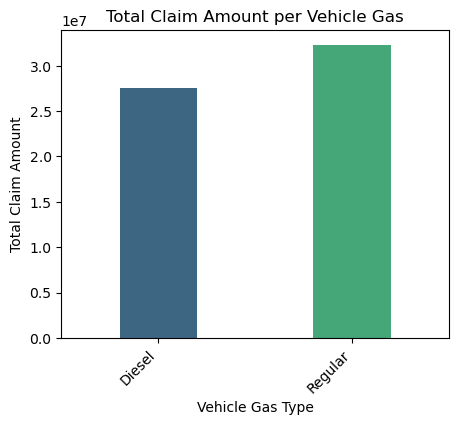

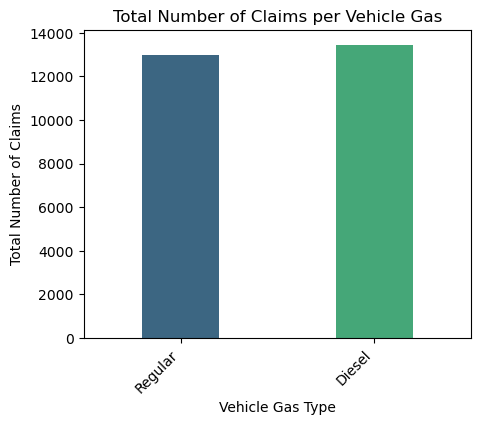

In [80]:
filtered_data = aggregated_data[aggregated_data['ClaimNb'] > 0]
vehgas_claims = filtered_data.groupby('VehGas').agg(
    total_claim_amount=('ClaimAmount', 'sum'),
    total_claim_nb=('ClaimNb', 'sum')
).reset_index()

# Sort by total claim amount
vehgas_claims = vehgas_claims.sort_values(by='total_claim_amount')

# Plot the total claim amount as a bar graph with vertical bars
plt.figure(figsize=(5, 4))
sns.barplot(x='VehGas', y='total_claim_amount', data=vehgas_claims, palette='viridis', width=0.4)
plt.title('Total Claim Amount per Vehicle Gas')
plt.xlabel('Vehicle Gas Type')
plt.ylabel('Total Claim Amount')
plt.xticks(rotation=45, ha='right')
plt.show()

# Sort by total claim number
vehgas_claims = vehgas_claims.sort_values(by='total_claim_nb')

# Plot the total count of claims as a bar graph with vertical bars
plt.figure(figsize=(5, 4))
sns.barplot(x='VehGas', y='total_claim_nb', data=vehgas_claims, palette='viridis', width=0.4)
plt.title('Total Number of Claims per Vehicle Gas')
plt.xlabel('Vehicle Gas Type')
plt.ylabel('Total Number of Claims')
plt.xticks(rotation=45, ha='right')
plt.show()

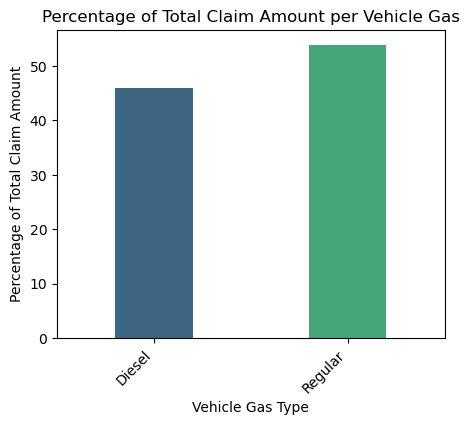

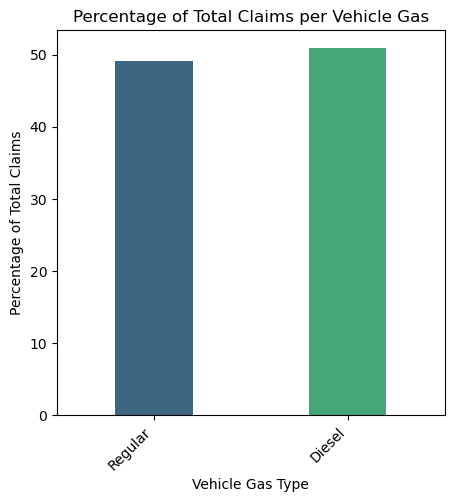

In [81]:
total_claim_amount = vehgas_claims['total_claim_amount'].sum()
vehgas_claims['Percentage_ClaimAmount'] = (vehgas_claims['total_claim_amount'] / total_claim_amount) * 100

# Calculate the total claim number and percentage
total_claim_nb = vehgas_claims['total_claim_nb'].sum()
vehgas_claims['Percentage_ClaimNb'] = (vehgas_claims['total_claim_nb'] / total_claim_nb) * 100

# Sort by percentage of total claim amount
vehgas_claims = vehgas_claims.sort_values(by='Percentage_ClaimAmount')

# Plot the percentage of total claim amount as a bar graph with vertical bars
plt.figure(figsize=(5, 4))
sns.barplot(x='VehGas', y='Percentage_ClaimAmount', data=vehgas_claims, palette='viridis', width=0.4)
plt.title('Percentage of Total Claim Amount per Vehicle Gas')
plt.xlabel('Vehicle Gas Type')
plt.ylabel('Percentage of Total Claim Amount')
plt.xticks(rotation=45, ha='right')
plt.show()

# Sort by percentage of total claim number
vehgas_claims = vehgas_claims.sort_values(by='Percentage_ClaimNb')

# Plot the percentage of total claims as a bar graph with vertical bars
plt.figure(figsize=(5, 5))
sns.barplot(x='VehGas', y='Percentage_ClaimNb', data=vehgas_claims, palette='viridis', width=0.4)
plt.title('Percentage of Total Claims per Vehicle Gas')
plt.xlabel('Vehicle Gas Type')
plt.ylabel('Percentage of Total Claims')
plt.xticks(rotation=45, ha='right')
plt.show()

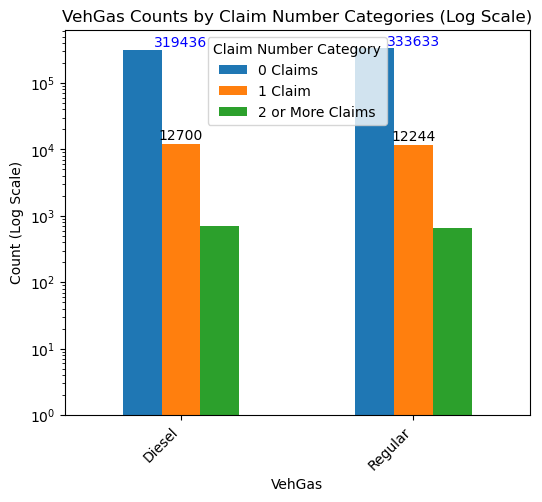

In [82]:
def categorize_claim_nb(claim_nb):
    if claim_nb == 0:
        return '0 Claims'
    elif claim_nb == 1:
        return '1 Claim'
    elif claim_nb >= 2:
        return '2 or More Claims'
    else:
        return None

# Apply the categorization function
aggregated_data['ClaimNbCategory'] = aggregated_data['ClaimNb'].apply(categorize_claim_nb)

# Filter out rows where ClaimNbCategory is None
filtered_data = aggregated_data[aggregated_data['ClaimNbCategory'].notnull()]

# Group by the new category and VehGas
grouped_data = filtered_data.groupby(['ClaimNbCategory', 'VehGas']).size().reset_index(name='Count')

# Pivot the data for plotting
pivot_data = grouped_data.pivot(index='VehGas', columns='ClaimNbCategory', values='Count').fillna(0)

# Calculate total claims per VehGas excluding '0 Claims'
pivot_data['Total Claims'] = pivot_data[['1 Claim', '2 or More Claims']].sum(axis=1)

# Plot the results with a logarithmic scale
ax = pivot_data.drop(columns='Total Claims').plot(kind='bar', figsize=(6, 5), log=True)
plt.title('VehGas Counts by Claim Number Categories (Log Scale)')
plt.xlabel('VehGas')
plt.ylabel('Count (Log Scale)')
plt.legend(title='Claim Number Category')

# Tilt the x-axis labels
plt.xticks(rotation=45, ha='right')

# Annotate total claims for each VehGas
for i, total in enumerate(pivot_data['Total Claims']):
    ax.text(i, total, f'{int(total)}', ha='center', va='bottom', fontsize=10, color='black', rotation=0)

# Annotate the values on top of the highest blue bar (0 Claims)
for i, value in enumerate(pivot_data['0 Claims']):
    ax.text(i, value, f'{int(value)}', ha='center', va='bottom', fontsize=10, color='blue', rotation=0)

plt.show()

In [83]:
vehgas_claims.head()

,VehGas,total_claim_amount,total_claim_nb,Percentage_ClaimAmount,Percentage_ClaimNb
1,Regular,32314542.55,12994,53.939184,49.137801
0,Diesel,27594673.95,13450,46.060816,50.862199


In [84]:
aggregated_data.info()  

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 678013 entries, 0 to 678012
Data columns (total 15 columns):
 #   Column            Non-Null Count   Dtype   
---  ------            --------------   -----   
 0   IDpol             678013 non-null  float64 
 1   ClaimAmount       678013 non-null  float64 
 2   ClaimNb           678013 non-null  int64   
 3   Exposure          678013 non-null  float64 
 4   Area              678013 non-null  object  
 5   VehPower          678013 non-null  float64 
 6   VehAge            678013 non-null  float64 
 7   DrivAge           678013 non-null  float64 
 8   BonusMalus        678013 non-null  float64 
 9   VehBrand          678013 non-null  object  
 10  VehGas            678013 non-null  object  
 11  Density           678013 non-null  float64 
 12  Region            678013 non-null  object  
 13  ClaimAmountRange  20746 non-null   category
 14  ClaimNbCategory   678013 non-null  object  
dtypes: category(1), float64(8), int64(1), object(5)
mem

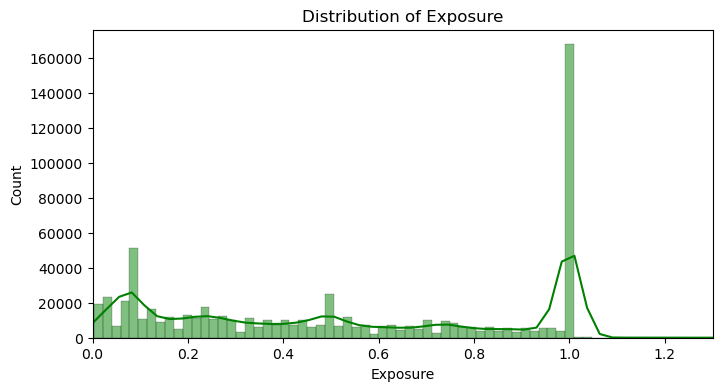

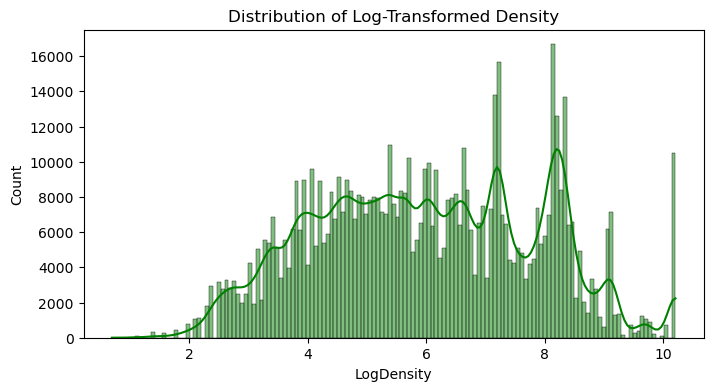

In [87]:
import numpy as np
numerical_columns = ['Exposure', 'Density']

# Apply log transformation to the Density column
aggregated_data['LogDensity'] = np.log(aggregated_data['Density'] + 1)  # Adding 1 to avoid log(0)

for column in numerical_columns:
    plt.figure(figsize=(8, 4))
    
    if column == 'Density':
        sns.histplot(data=aggregated_data, x='LogDensity', kde=True, color='green')
        plt.title('Distribution of Log-Transformed Density')
        plt.xlabel('LogDensity')
    else:
        sns.histplot(data=aggregated_data, x=column, kde=True, color='green')
        plt.title(f'Distribution of {column}')
        plt.xlabel(column)
    
    plt.ylabel('Count')
    
    if column == 'Exposure':
        plt.xlim(0, 1.3)
    
    plt.show()

In [91]:
# Handling outliers differently for each feature as per the discussed strategies.

# 1. Log Transformation for ClaimAmount and Density to reduce skewness
aggregated_data['ClaimAmount'] = aggregated_data['ClaimAmount'].apply(lambda x: np.log1p(x))  # Log(1 + ClaimAmount)

# 2. Remove Exposure outliers (outliers detected earlier using IQR)
Q1_exp = aggregated_data['Exposure'].quantile(0.25)
Q3_exp = aggregated_data['Exposure'].quantile(0.75)
IQR_exp = Q3_exp - Q1_exp
exposure_lower_bound = Q1_exp - 1.5 * IQR_exp
exposure_upper_bound = Q3_exp + 1.5 * IQR_exp
aggregated_data= aggregated_data[(aggregated_data['Exposure'] >= exposure_lower_bound) & (aggregated_data['Exposure'] <= exposure_upper_bound)]

# 3. Capping for VehPower, VehAge, DrivAge, and BonusMalus
capping_dict = {
    'VehPower': 0.99,
    'VehAge': 0.99,
    'DrivAge': 0.99,
    'BonusMalus': 0.99
}

for column, percentile in capping_dict.items():
    upper_cap = aggregated_data[column].quantile(percentile)
    aggregated_data[column] = aggregated_data[column].apply(lambda x: min(x, upper_cap))

# Keep ClaimNb outliers, but can flag them for further analysis if necessary

# Display updated data info after handling outliers
aggregated_data.info(), aggregated_data[['ClaimAmount']].describe()


<class 'pandas.core.frame.DataFrame'>
Index: 677979 entries, 0 to 678012
Data columns (total 16 columns):
 #   Column            Non-Null Count   Dtype   
---  ------            --------------   -----   
 0   IDpol             677979 non-null  float64 
 1   ClaimAmount       677979 non-null  float64 
 2   ClaimNb           677979 non-null  int64   
 3   Exposure          677979 non-null  float64 
 4   Area              677979 non-null  object  
 5   VehPower          677979 non-null  float64 
 6   VehAge            677979 non-null  float64 
 7   DrivAge           677979 non-null  float64 
 8   BonusMalus        677979 non-null  float64 
 9   VehBrand          677979 non-null  object  
 10  VehGas            677979 non-null  object  
 11  Density           677979 non-null  float64 
 12  Region            677979 non-null  object  
 13  ClaimAmountRange  20713 non-null   category
 14  ClaimNbCategory   677979 non-null  object  
 15  LogDensity        677979 non-null  float64 
dtypes: cate

(None,
          ClaimAmount
 count  677979.000000
 mean        0.040975
 std         0.210068
 min         0.000000
 25%         0.000000
 50%         0.000000
 75%         0.000000
 max         1.331383)

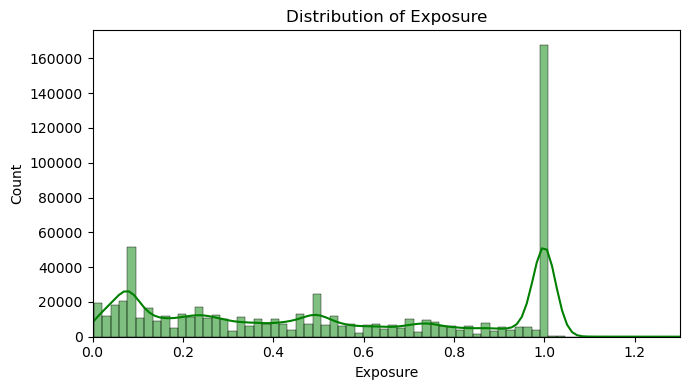

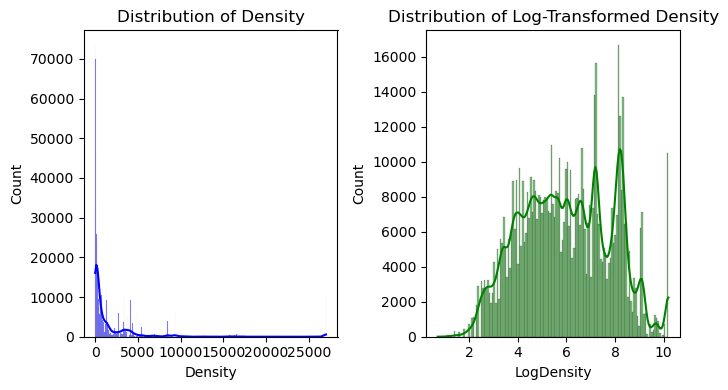

In [92]:
numerical_columns = ['Exposure', 'Density']

# Apply log transformation to the Density column
aggregated_data['LogDensity'] = np.log(aggregated_data['Density'] + 1)  # Adding 1 to avoid log(0)

for column in numerical_columns:
    plt.figure(figsize=(7, 4))
    
    if column == 'Density':
        # Plot the normal Density
        plt.subplot(1, 2, 1)
        sns.histplot(data=aggregated_data, x=column, kde=True, color='blue')
        plt.title('Distribution of Density')
        plt.xlabel('Density')
        plt.ylabel('Count')
        
        # Plot the log-transformed Density
        plt.subplot(1, 2, 2)
        sns.histplot(data=aggregated_data, x='LogDensity', kde=True, color='green')
        plt.title('Distribution of Log-Transformed Density')
        plt.xlabel('LogDensity')
        plt.ylabel('Count')
    else:
        sns.histplot(data=aggregated_data, x=column, kde=True, color='green')
        plt.title(f'Distribution of {column}')
        plt.xlabel(column)
        plt.ylabel('Count')
        
        if column == 'Exposure':
            plt.xlim(0, 1.3)
    
    plt.tight_layout()
    plt.show()

In [379]:
aggregated_data["LogDensity"].unique()

array([7.10496545, 4.00733319, 4.34380542, ..., 6.94408721, 6.92165818,
       6.81234509])

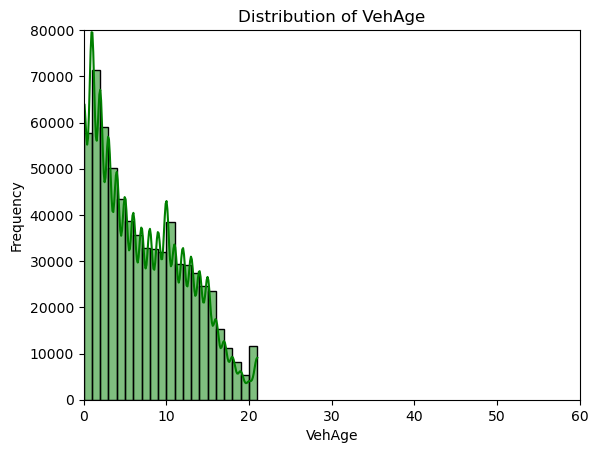

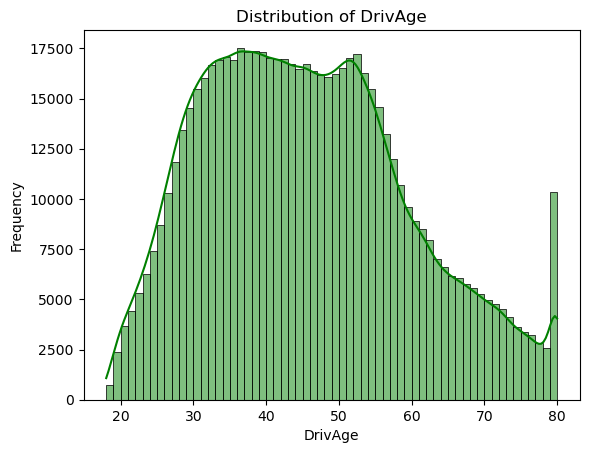

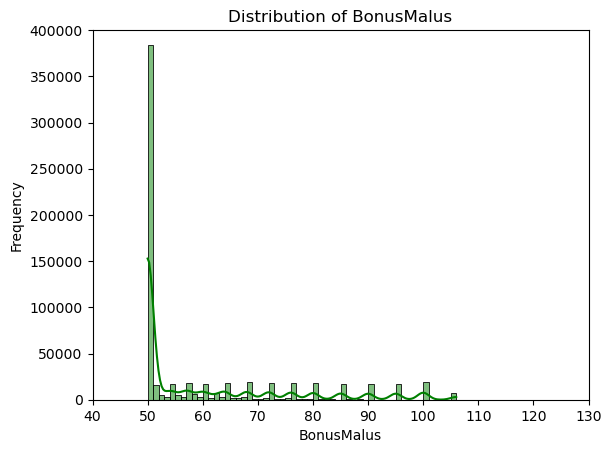

In [93]:
numerical_columns = ['VehAge', 'DrivAge', 'BonusMalus']

for column in numerical_columns:
    sns.histplot(data=aggregated_data, x=column, kde=True, color='green', binwidth=1)  # Adjust binwidth as needed
   

    plt.title('Distribution of ' + column)
    plt.xlabel(column)
    plt.ylabel('Frequency')
        
    if column == 'VehAge':
        plt.xlim(0, 60)
        plt.ylim(0, 80000)
    
    if column == 'BonusMalus':
        plt.xlim(40, 130)
        plt.ylim(0, 400000)
    
    plt.show()



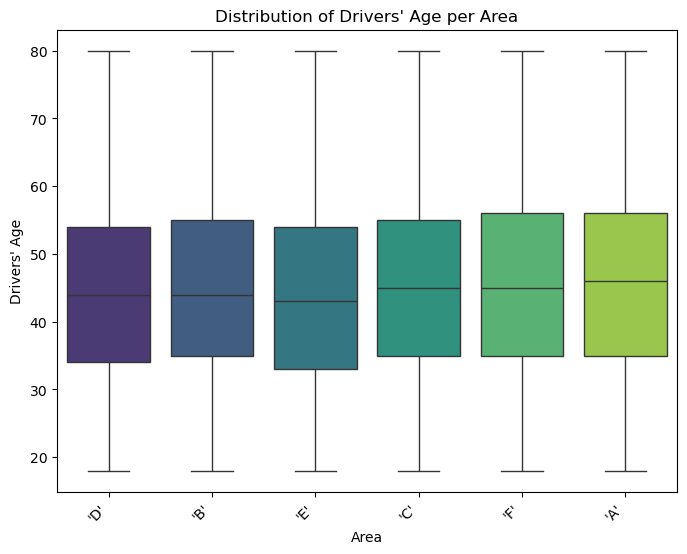

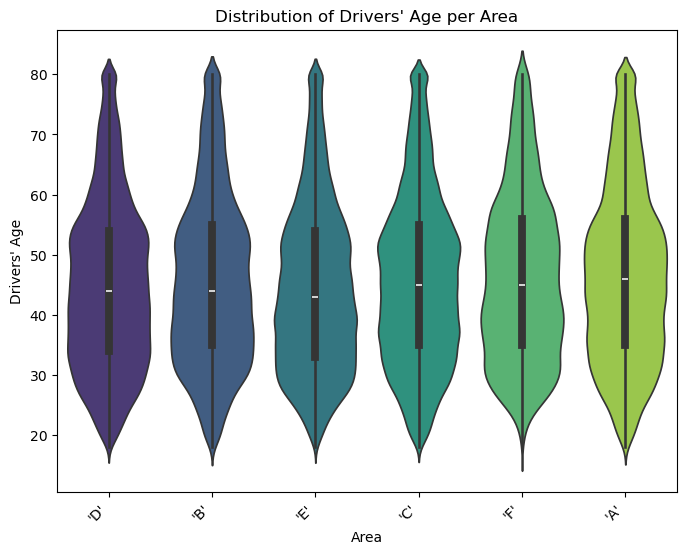

In [94]:
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming 'Area' is the categorical column and 'DrivAge' is the continuous numerical column
plt.figure(figsize=(8, 6))

# Create a box plot
sns.boxplot(data=aggregated_data, x='Area', y='DrivAge', palette='viridis')
plt.title('Distribution of Drivers\' Age per Area')
plt.xlabel('Area')
plt.ylabel('Drivers\' Age')
plt.xticks(rotation=45, ha='right')
plt.show()

# Alternatively, you can create a violin plot
plt.figure(figsize=(8, 6))
sns.violinplot(data=aggregated_data, x='Area', y='DrivAge', palette='viridis')
plt.title('Distribution of Drivers\' Age per Area')
plt.xlabel('Area')
plt.ylabel('Drivers\' Age')
plt.xticks(rotation=45, ha='right')
plt.show()

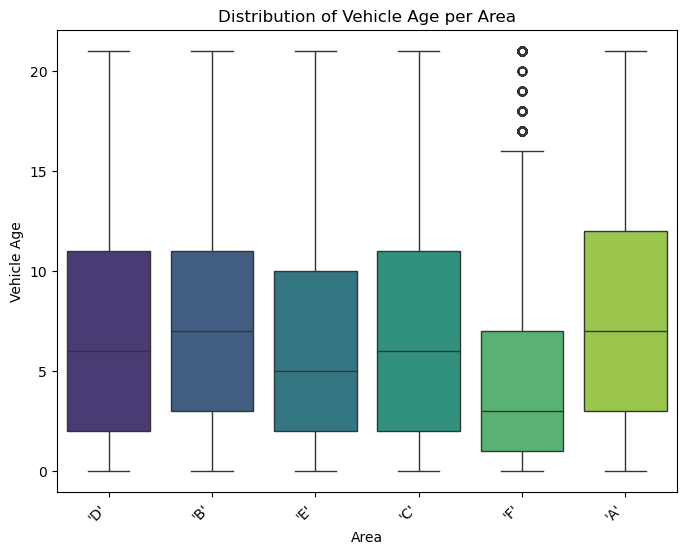

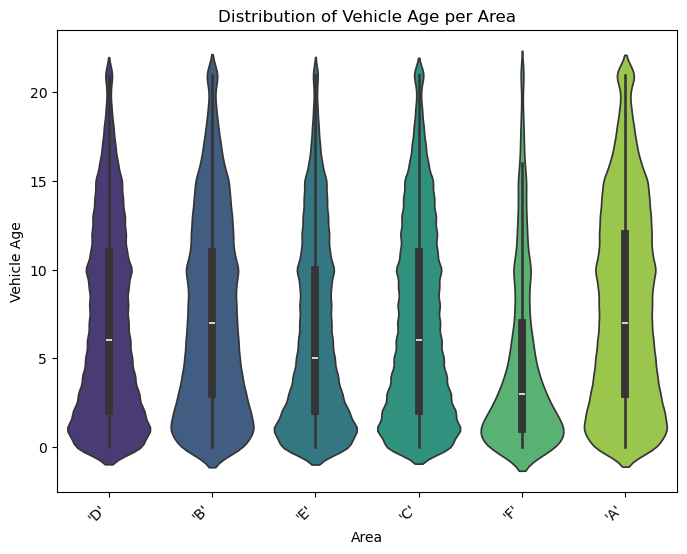

In [95]:
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming 'Area' is the categorical column and 'VehAge' is the continuous numerical column
plt.figure(figsize=(8, 6))

# Create a box plot
sns.boxplot(data=aggregated_data, x='Area', y='VehAge', palette='viridis')
plt.title('Distribution of Vehicle Age per Area')
plt.xlabel('Area')
plt.ylabel('Vehicle Age')
plt.xticks(rotation=45, ha='right')
plt.show()

# Alternatively, you can create a violin plot
plt.figure(figsize=(8, 6))
sns.violinplot(data=aggregated_data, x='Area', y='VehAge', palette='viridis')
plt.title('Distribution of Vehicle Age per Area')
plt.xlabel('Area')
plt.ylabel('Vehicle Age')
plt.xticks(rotation=45, ha='right')
plt.show()

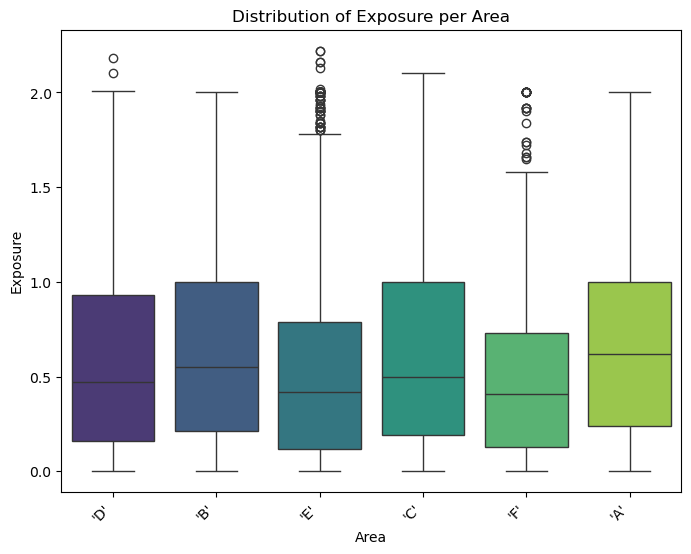

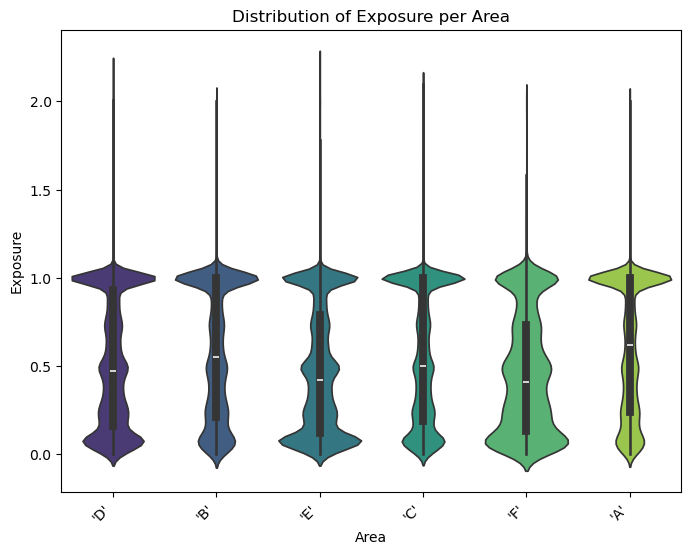

In [96]:
plt.figure(figsize=(8, 6))

# Create a box plot
sns.boxplot(data=aggregated_data, x='Area', y='Exposure', palette='viridis')
plt.title('Distribution of Exposure per Area')
plt.xlabel('Area')
plt.ylabel('Exposure')
plt.xticks(rotation=45, ha='right')
plt.show()

# Alternatively, you can create a violin plot
plt.figure(figsize=(8, 6))
sns.violinplot(data=aggregated_data, x='Area', y='Exposure', palette='viridis')
plt.title('Distribution of Exposure per Area')
plt.xlabel('Area')
plt.ylabel('Exposure')
plt.xticks(rotation=45, ha='right')
plt.show()

In [97]:
aggregated_data.Exposure.value_counts().sort_index()

Exposure
0.002732    1060
0.002740    2045
0.005464     609
0.005479    1395
0.008197     620
            ... 
2.100000       2
2.130000       1
2.160000       2
2.180000       1
2.220000       2
Name: count, Length: 209, dtype: int64

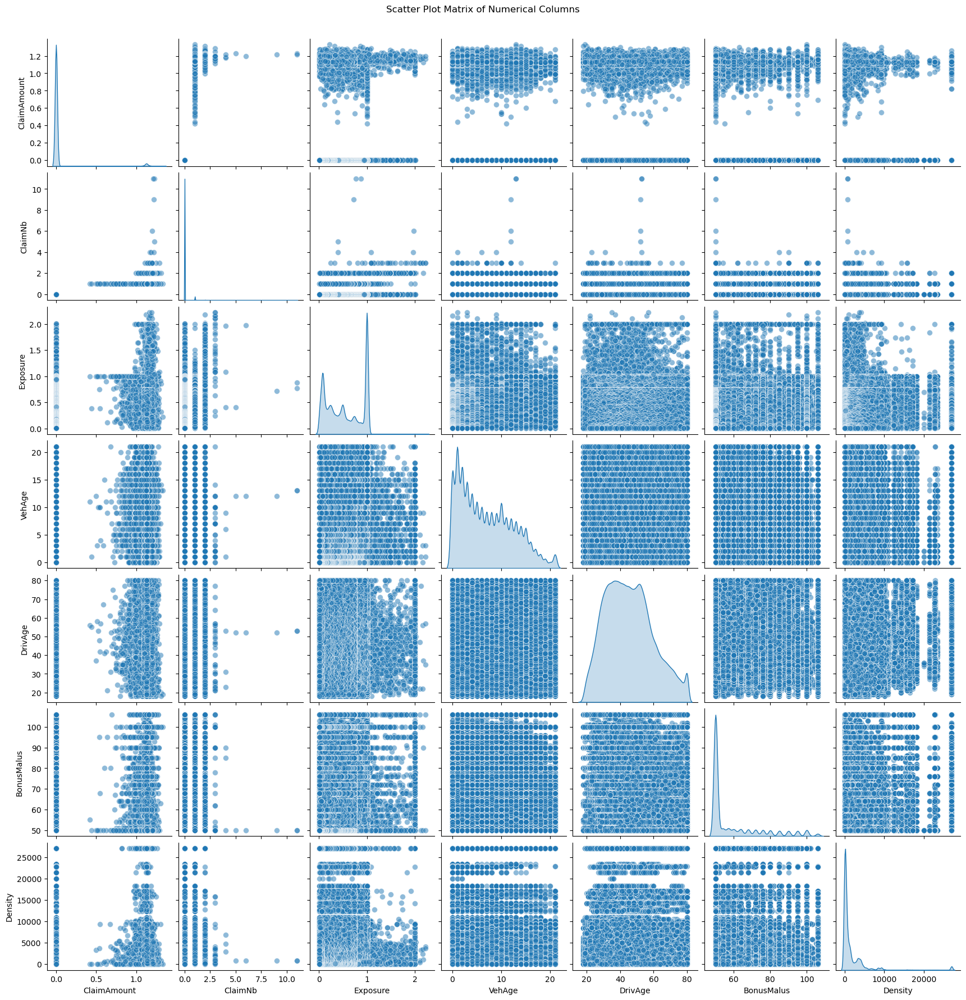

In [98]:
numerical_columns = ['ClaimAmount', 'ClaimNb', 'Exposure', 'VehAge', 'DrivAge', 'BonusMalus', 'Density']
sns.pairplot(aggregated_data[numerical_columns], diag_kind='kde', plot_kws={'alpha':0.5, 's':50})
plt.suptitle('Scatter Plot Matrix of Numerical Columns', y=1.02)
plt.show()

In [99]:
print(aggregated_data.isna().sum())

IDpol                    0
ClaimAmount              0
ClaimNb                  0
Exposure                 0
Area                     0
VehPower                 0
VehAge                   0
DrivAge                  0
BonusMalus               0
VehBrand                 0
VehGas                   0
Density                  0
Region                   0
ClaimAmountRange    657266
ClaimNbCategory          0
LogDensity               0
dtype: int64


In [100]:
aggregated_data['AvgClaimAmountPerExposure'] = aggregated_data['ClaimAmount'] / aggregated_data['Exposure']
aggregated_data['AvgClaimAmountPerExposure'].replace([float('inf'), -float('inf')], float('nan'), inplace=True)

In [101]:
aggregated_data['Target'] = np.where(aggregated_data['ClaimAmount'] > 0, 1, 0)
print(aggregated_data['Target'].value_counts(normalize=True)*100)
print(aggregated_data.head())

Target
0    96.325845
1     3.674155
Name: proportion, dtype: float64
   IDpol  ClaimAmount  ClaimNb  Exposure Area  VehPower  VehAge  DrivAge  \
0    1.0          0.0        0      0.10  'D'       5.0     0.0     55.0   
1    3.0          0.0        0      0.77  'D'       5.0     0.0     55.0   
2    5.0          0.0        0      0.75  'B'       6.0     2.0     52.0   
3   10.0          0.0        0      0.09  'B'       7.0     0.0     46.0   
4   11.0          0.0        0      0.84  'B'       7.0     0.0     46.0   

   BonusMalus VehBrand   VehGas  Density Region ClaimAmountRange  \
0        50.0    'B12'  Regular   1217.0  'R82'              NaN   
1        50.0    'B12'  Regular   1217.0  'R82'              NaN   
2        50.0    'B12'   Diesel     54.0  'R22'              NaN   
3        50.0    'B12'   Diesel     76.0  'R72'              NaN   
4        50.0    'B12'   Diesel     76.0  'R72'              NaN   

  ClaimNbCategory  LogDensity  AvgClaimAmountPerExposure  Target

##### Creating age groups

##### Formatting strings in categorical columns

In [102]:
aggregated_data['VehBrand'] = aggregated_data['VehBrand'].str.replace("'", "")
aggregated_data['Region'] = aggregated_data['Region'].str.replace("'", "")
aggregated_data['Area'] = aggregated_data['Area'].str.replace("'", "")
aggregated_data.head()


,IDpol,ClaimAmount,ClaimNb,Exposure,Area,VehPower,VehAge,DrivAge,BonusMalus,VehBrand,VehGas,Density,Region,ClaimAmountRange,ClaimNbCategory,LogDensity,AvgClaimAmountPerExposure,Target
0,1.0,0.0,0,0.10,D,5.0,0.0,55.0,50.0,B12,Regular,1217.0,R82,NaN,0 Claims,7.104965,0.0,0
1,3.0,0.0,0,0.77,D,5.0,0.0,55.0,50.0,B12,Regular,1217.0,R82,NaN,0 Claims,7.104965,0.0,0
2,5.0,0.0,0,0.75,B,6.0,2.0,52.0,50.0,B12,Diesel,54.0,R22,NaN,0 Claims,4.007333,0.0,0
3,10.0,0.0,0,0.09,B,7.0,0.0,46.0,50.0,B12,Diesel,76.0,R72,NaN,0 Claims,4.343805,0.0,0
4,11.0,0.0,0,0.84,B,7.0,0.0,46.0,50.0,B12,Diesel,76.0,R72,NaN,0 Claims,4.343805,0.0,0


In [103]:
aggregated_data = aggregated_data.drop(columns=['ClaimAmountRange'])

In [104]:
aggregated_data = aggregated_data.drop(columns=['ClaimNbCategory', 'Density'])

In [105]:
aggregated_data.head()

,IDpol,ClaimAmount,ClaimNb,Exposure,Area,VehPower,VehAge,DrivAge,BonusMalus,VehBrand,VehGas,Region,LogDensity,AvgClaimAmountPerExposure,Target
0,1.0,0.0,0,0.10,D,5.0,0.0,55.0,50.0,B12,Regular,R82,7.104965,0.0,0
1,3.0,0.0,0,0.77,D,5.0,0.0,55.0,50.0,B12,Regular,R82,7.104965,0.0,0
2,5.0,0.0,0,0.75,B,6.0,2.0,52.0,50.0,B12,Diesel,R22,4.007333,0.0,0
3,10.0,0.0,0,0.09,B,7.0,0.0,46.0,50.0,B12,Diesel,R72,4.343805,0.0,0
4,11.0,0.0,0,0.84,B,7.0,0.0,46.0,50.0,B12,Diesel,R72,4.343805,0.0,0


##### One-hot Encoding of Age gruops and Gas Type of the vehicles

In [106]:
bins_vehage = [0, 3, 7, 15,float('inf')] 
labels_vehage = ['New', 'Mid-aged', 'Old', 'Very Old'] 
aggregated_data['VehAgeGroup'] = pd.cut(aggregated_data['VehAge'], bins=bins_vehage, labels=labels_vehage,include_lowest=True)


bins_drivage = [18, 25, 40, 60, float('inf')]
labels_drivage = ['Young', 'Adult', 'Middle-aged', 'Senior']
aggregated_data['DrivAgeGroup'] = pd.cut(aggregated_data['DrivAge'], bins=bins_drivage, labels=labels_drivage, include_lowest=True)
aggregated_data = aggregated_data.drop(columns=['VehAge', 'DrivAge'])

In [107]:
aggregated_data = pd.get_dummies(aggregated_data, columns=['VehBrand', 'VehGas', 'Region', 'Area','VehAgeGroup','DrivAgeGroup'], drop_first=True).astype(int)



In [108]:
aggregated_data.head()

,IDpol,ClaimAmount,ClaimNb,Exposure,VehPower,BonusMalus,LogDensity,AvgClaimAmountPerExposure,Target,VehBrand_B10,...,Area_C,Area_D,Area_E,Area_F,VehAgeGroup_Mid-aged,VehAgeGroup_Old,VehAgeGroup_Very Old,DrivAgeGroup_Adult,DrivAgeGroup_Middle-aged,DrivAgeGroup_Senior
0,1,0,0,0,5,50,7,0,0,0,...,0,1,0,0,0,0,0,0,1,0
1,3,0,0,0,5,50,7,0,0,0,...,0,1,0,0,0,0,0,0,1,0
2,5,0,0,0,6,50,4,0,0,0,...,0,0,0,0,0,0,0,0,1,0
3,10,0,0,0,7,50,4,0,0,0,...,0,0,0,0,0,0,0,0,1,0
4,11,0,0,0,7,50,4,0,0,0,...,0,0,0,0,0,0,0,0,1,0


##### Scaling numerical columns

In [109]:
from sklearn.preprocessing import StandardScaler
columns_to_scale = ['LogDensity', 'BonusMalus', 'VehPower', 'Exposure']
scaler = StandardScaler()
aggregated_data[columns_to_scale] = scaler.fit_transform(aggregated_data[columns_to_scale])
aggregated_data.head()

,IDpol,ClaimAmount,ClaimNb,Exposure,VehPower,BonusMalus,LogDensity,AvgClaimAmountPerExposure,Target,VehBrand_B10,...,Area_C,Area_D,Area_E,Area_F,VehAgeGroup_Mid-aged,VehAgeGroup_Old,VehAgeGroup_Very Old,DrivAgeGroup_Adult,DrivAgeGroup_Middle-aged,DrivAgeGroup_Senior
0,1,0,0,-0.577393,-0.718844,-0.636594,0.764831,0,0,0,...,0,1,0,0,0,0,0,0,1,0
1,3,0,0,-0.577393,-0.718844,-0.636594,0.764831,0,0,0,...,0,1,0,0,0,0,0,0,1,0
2,5,0,0,-0.577393,-0.220524,-0.636594,-0.791975,0,0,0,...,0,0,0,0,0,0,0,0,1,0
3,10,0,0,-0.577393,0.277796,-0.636594,-0.791975,0,0,0,...,0,0,0,0,0,0,0,0,1,0
4,11,0,0,-0.577393,0.277796,-0.636594,-0.791975,0,0,0,...,0,0,0,0,0,0,0,0,1,0


##### Selection of train and test datasets

In [110]:
from sklearn.model_selection import train_test_split
X = aggregated_data.drop(columns=["IDpol", "ClaimNb","ClaimAmount", "AvgClaimAmountPerExposure", "Target"])
y = aggregated_data['Target']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify=y, random_state=42)
print("Training set target distribution:")
print(y_train.value_counts(normalize=True))
print("\nTest set target distribution:")
print(y_test.value_counts(normalize=True))

Training set target distribution:
Target
0    0.963258
1    0.036742
Name: proportion, dtype: float64

Test set target distribution:
Target
0    0.963259
1    0.036741
Name: proportion, dtype: float64


In [111]:
from imblearn.metrics import classification_report_imbalanced
from sklearn.metrics import classification_report
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from sklearn.linear_model import LogisticRegression

# Define the models
xgb_model = XGBClassifier(random_state=42)
lgbm_model = LGBMClassifier(random_state=42)
logreg_model = LogisticRegression(random_state=42)

# List of models
models = [
    ('XGBoost', xgb_model),
    ('LightGBM', lgbm_model),
    ('Logistic Regression', logreg_model)
]
for name, model in models:
    print(f"Evaluating {name}...")
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    report = classification_report(y_test, y_pred)
    print(f"Classification Report for {name}:\n{report}\n")

Evaluating XGBoost...
Classification Report for XGBoost:
              precision    recall  f1-score   support

           0       0.96      1.00      0.98    130614
           1       0.74      0.02      0.04      4982

    accuracy                           0.96    135596
   macro avg       0.85      0.51      0.51    135596
weighted avg       0.96      0.96      0.95    135596


Evaluating LightGBM...
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 19928, number of negative: 522455
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006717 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 170
[LightGBM] [Info] Number of data points in the train set: 542383, number of used features: 47
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.036742 -> initscore=-3.266413
[LightG

### Performance with class weights

Evaluating XGBoost...
Classification Report for XGBoost:
              precision    recall  f1-score   support

           0       0.97      0.73      0.83    130614
           1       0.06      0.49      0.11      4982

    accuracy                           0.72    135596
   macro avg       0.52      0.61      0.47    135596
weighted avg       0.94      0.72      0.81    135596


Confusion Matrix for XGBoost:
[[95320 35294]
 [ 2535  2447]]



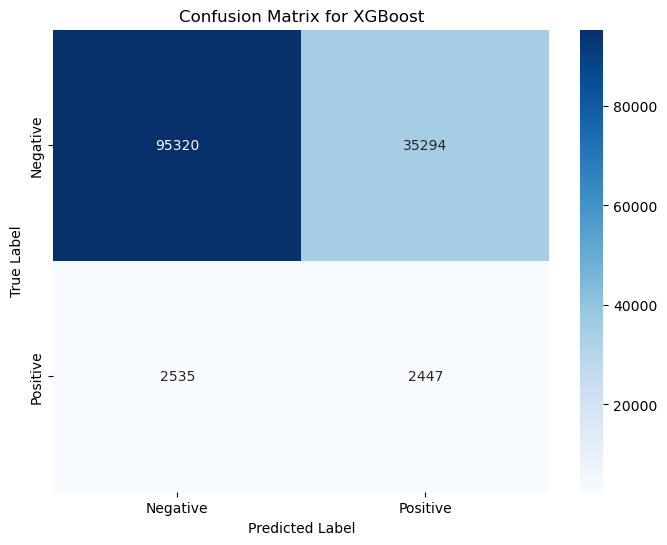

Evaluating LightGBM...
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 19928, number of negative: 522455
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.008351 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 170
[LightGBM] [Info] Number of data points in the train set: 542383, number of used features: 47
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=-0.000000
[LightGBM] [Info] Start training from score -0.000000
Classification Report for LightGBM:
              precision    recall  f1-score   support

           0       0.97      0.72      0.83    130614
           1       0.07      0.51      0.12      4982

    accuracy                           0.71    135596
   macro avg       0.52      0.62      0.47    135596
weighted avg       0.94      0

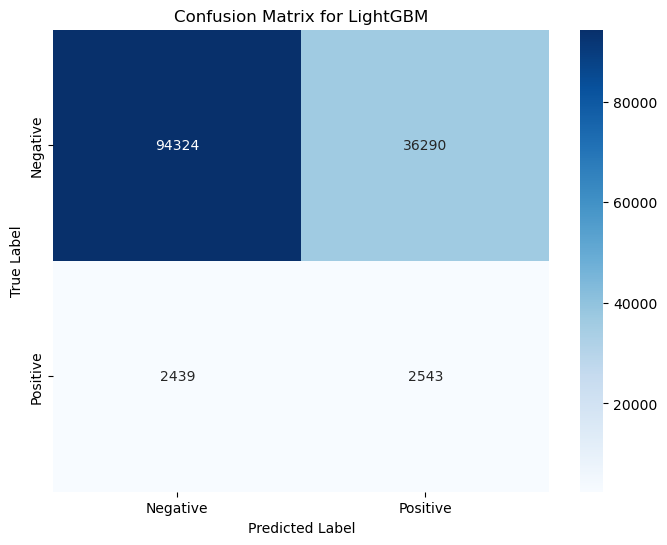

Evaluating Logistic Regression...
Classification Report for Logistic Regression:
              precision    recall  f1-score   support

           0       0.97      0.62      0.76    130614
           1       0.05      0.58      0.10      4982

    accuracy                           0.62    135596
   macro avg       0.51      0.60      0.43    135596
weighted avg       0.94      0.62      0.73    135596


Confusion Matrix for Logistic Regression:
[[81034 49580]
 [ 2103  2879]]



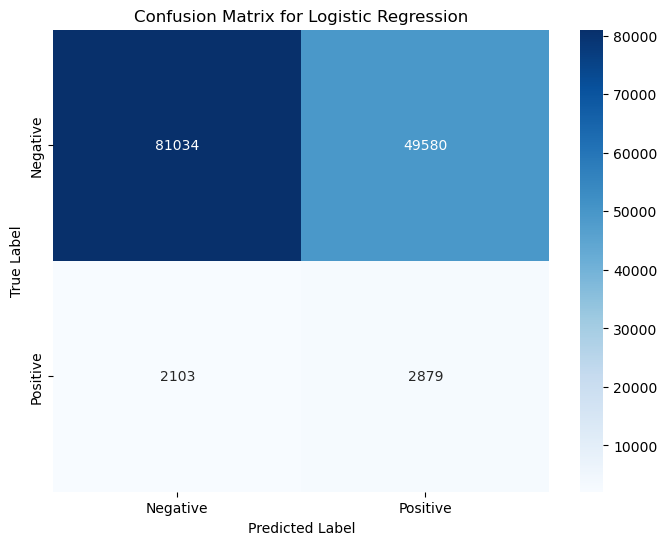

In [112]:
from sklearn.metrics import classification_report, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split

class_weights = y.value_counts().to_dict()
total_samples = len(y)
class_weights = {k: total_samples / v for k, v in class_weights.items()}

xgb_model2 = XGBClassifier(random_state=42, scale_pos_weight=class_weights[1] / class_weights[0])
lgbm_model2 = LGBMClassifier(random_state=42, class_weight='balanced')
logreg_model2 = LogisticRegression(random_state=42, class_weight='balanced')

models2 = [
    ('XGBoost', xgb_model2),
    ('LightGBM', lgbm_model2),
    ('Logistic Regression', logreg_model2)
]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify=y, random_state=42)

for name, model in models2:
    print(f"Evaluating {name}...")
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    report = classification_report(y_test, y_pred)
    print(f"Classification Report for {name}:\n{report}\n")
    
    cm = confusion_matrix(y_test, y_pred)
    print(f"Confusion Matrix for {name}:\n{cm}\n")
    
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['Negative', 'Positive'], yticklabels=['Negative', 'Positive'])
    plt.title(f'Confusion Matrix for {name}')
    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')
    plt.show()

##### With Smote

Evaluating XGBoost...
Classification Report for XGBoost:
              precision    recall  f1-score   support

           0       0.97      0.25      0.39    130614
           1       0.04      0.82      0.08      4982

    accuracy                           0.27    135596
   macro avg       0.51      0.54      0.23    135596
weighted avg       0.94      0.27      0.38    135596


Confusion Matrix for XGBoost:
[[32117 98497]
 [  875  4107]]



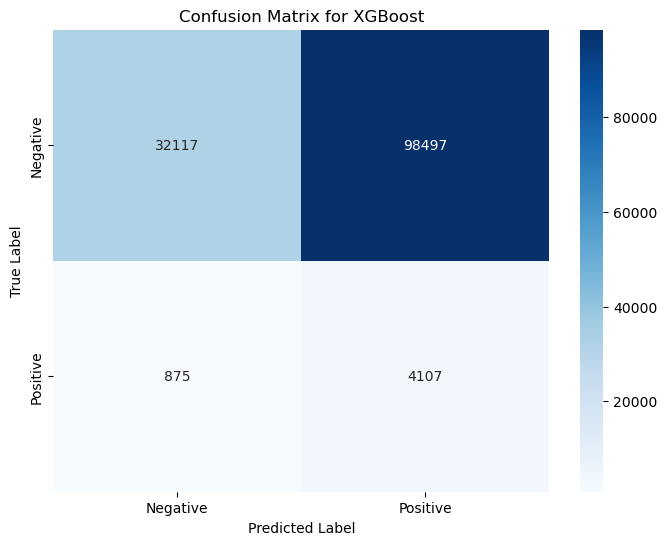

Evaluating LightGBM...
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 522455, number of negative: 522455
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.010612 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 863
[LightGBM] [Info] Number of data points in the train set: 1044910, number of used features: 47
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
Classification Report for LightGBM:
              precision    recall  f1-score   support

           0       0.97      0.97      0.97    130614
           1       0.12      0.11      0.11      4982

    accuracy                           0.94    135596
   macro avg       0.54      0.54      0.54    135596
weighted avg       0.94      0.94      0.94    135596


Confusion Matrix for LightG

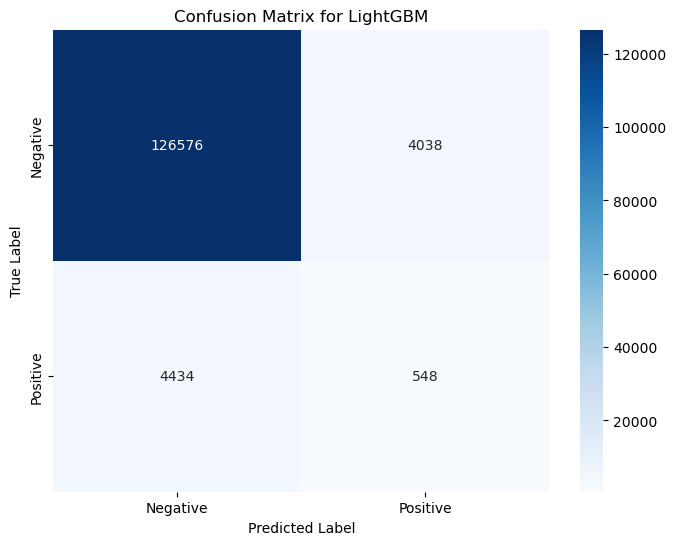

Evaluating Logistic Regression...
Classification Report for Logistic Regression:
              precision    recall  f1-score   support

           0       0.97      0.70      0.82    130614
           1       0.05      0.39      0.08      4982

    accuracy                           0.69    135596
   macro avg       0.51      0.54      0.45    135596
weighted avg       0.93      0.69      0.79    135596


Confusion Matrix for Logistic Regression:
[[91970 38644]
 [ 3062  1920]]



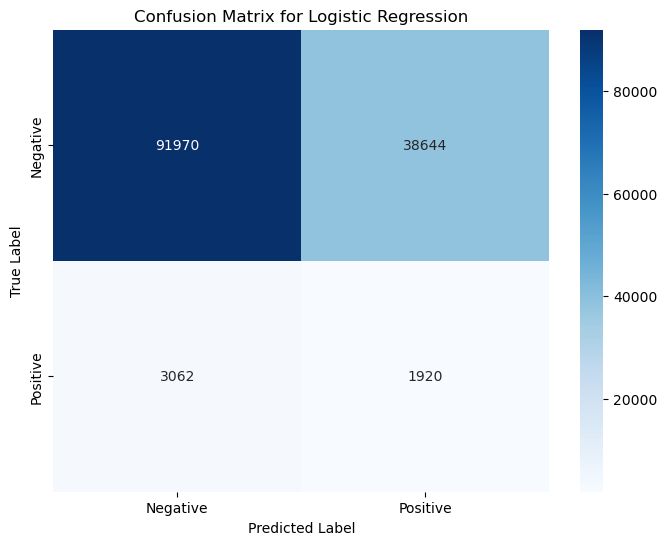

In [113]:
from sklearn.metrics import classification_report, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from imblearn.over_sampling import SMOTE

# Define class weights
class_weights = y.value_counts().to_dict()
total_samples = len(y)
class_weights = {k: total_samples / v for k, v in class_weights.items()}

# Define models with class weights
xgb_model3 = XGBClassifier(random_state=42, scale_pos_weight=class_weights[1] / class_weights[0])
lgbm_model3 = LGBMClassifier(random_state=42, class_weight='balanced')
logreg_model3 = LogisticRegression(random_state=42, class_weight='balanced')

models3 = [
    ('XGBoost', xgb_model3),
    ('LightGBM', lgbm_model3),
    ('Logistic Regression', logreg_model3)
]

# Split the data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify=y, random_state=42)

# Apply SMOTE to the training data
smote = SMOTE(random_state=42)
X_train_smote, y_train_smote = smote.fit_resample(X_train, y_train)

for name, model in models3:
    print(f"Evaluating {name}...")
    model.fit(X_train_smote, y_train_smote)
    y_pred = model.predict(X_test)
    report = classification_report(y_test, y_pred)
    print(f"Classification Report for {name}:\n{report}\n")
    
    cm = confusion_matrix(y_test, y_pred)
    print(f"Confusion Matrix for {name}:\n{cm}\n")
    
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['Negative', 'Positive'], yticklabels=['Negative', 'Positive'])
    plt.title(f'Confusion Matrix for {name}')
    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')
    plt.show()

#### Randomoversampler

Evaluating XGBoost...
Classification Report for XGBoost:
              precision    recall  f1-score   support

           0       0.97      0.05      0.10    130614
           1       0.04      0.96      0.07      4989

    accuracy                           0.09    135603
   macro avg       0.51      0.51      0.09    135603
weighted avg       0.94      0.09      0.10    135603


Confusion Matrix for XGBoost:
[[  7140 123474]
 [   193   4796]]



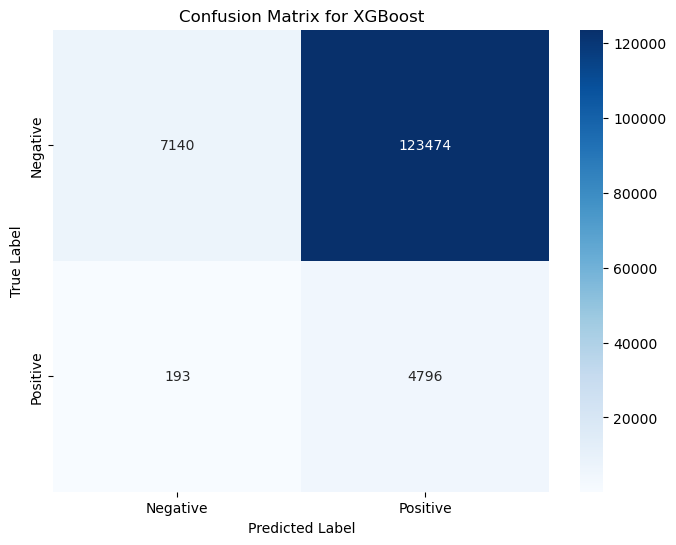

Evaluating LightGBM...
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 522455, number of negative: 522455
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006814 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 206
[LightGBM] [Info] Number of data points in the train set: 1044910, number of used features: 47
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
Classification Report for LightGBM:
              precision    recall  f1-score   support

           0       0.98      0.72      0.83    130614
           1       0.07      0.52      0.12      4989

    accuracy                           0.71    135603
   macro avg       0.52      0.62      0.47    135603
weighted avg       0.94      0.71      0.80    135603


Confusion Matrix for LightG

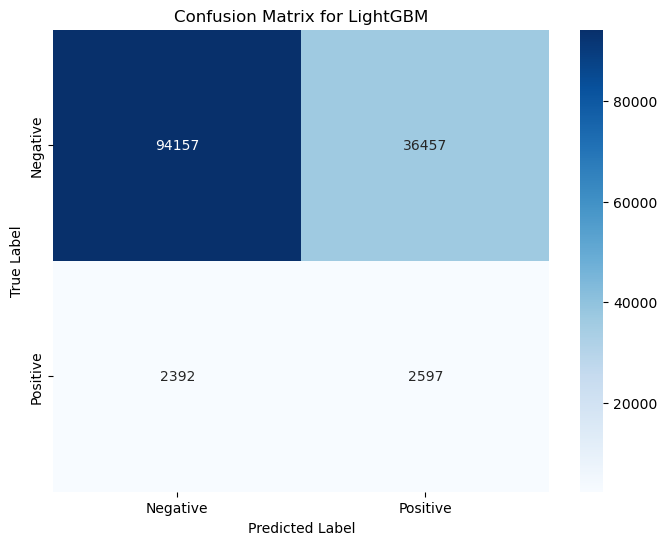

Evaluating Logistic Regression...
Classification Report for Logistic Regression:
              precision    recall  f1-score   support

           0       0.98      0.62      0.76    130614
           1       0.06      0.58      0.10      4989

    accuracy                           0.62    135603
   macro avg       0.52      0.60      0.43    135603
weighted avg       0.94      0.62      0.74    135603


Confusion Matrix for Logistic Regression:
[[81385 49229]
 [ 2083  2906]]



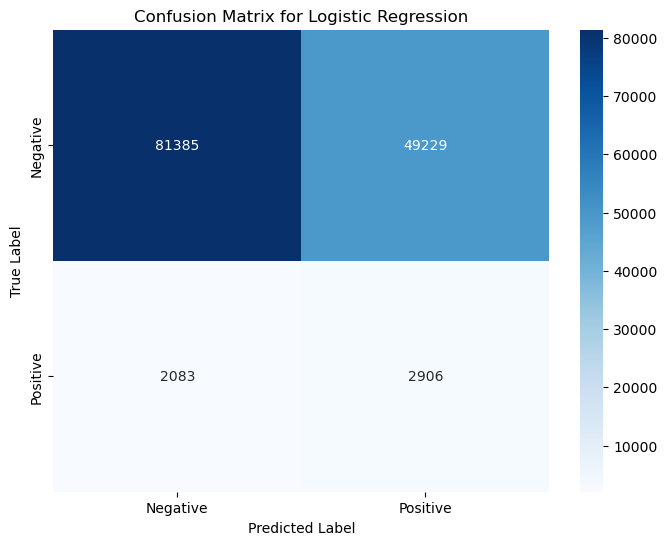

In [403]:
from sklearn.metrics import classification_report, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from imblearn.over_sampling import RandomOverSampler

# Define class weights
class_weights = y.value_counts().to_dict()
total_samples = len(y)
class_weights = {k: total_samples / v for k, v in class_weights.items()}

# Define models with class weights
xgb_model4 = XGBClassifier(random_state=42, scale_pos_weight=class_weights[1] / class_weights[0])
lgbm_model4 = LGBMClassifier(random_state=42, class_weight='balanced')
logreg_model4 = LogisticRegression(random_state=42, class_weight='balanced')

models4 = [
    ('XGBoost', xgb_model4),
    ('LightGBM', lgbm_model4),
    ('Logistic Regression', logreg_model4)
]

# Split the data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify=y, random_state=42)

# Apply RandomOverSampler to the training data
ros = RandomOverSampler(random_state=42)
X_train_ros, y_train_ros = ros.fit_resample(X_train, y_train)

for name, model in models4:
    print(f"Evaluating {name}...")
    model.fit(X_train_ros, y_train_ros)
    y_pred = model.predict(X_test)
    report = classification_report(y_test, y_pred)
    print(f"Classification Report for {name}:\n{report}\n")
    
    cm = confusion_matrix(y_test, y_pred)
    print(f"Confusion Matrix for {name}:\n{cm}\n")
    
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['Negative', 'Positive'], yticklabels=['Negative', 'Positive'])
    plt.title(f'Confusion Matrix for {name}')
    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')
    plt.show()

Evaluating XGBoost...
ROC AUC for XGBoost: 0.6598

Evaluating LightGBM...
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 19955, number of negative: 522455
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004660 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 204
[LightGBM] [Info] Number of data points in the train set: 542410, number of used features: 47
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=-0.000000
[LightGBM] [Info] Start training from score -0.000000
ROC AUC for LightGBM: 0.6695

Evaluating Logistic Regression...
ROC AUC for Logistic Regression: 0.6477



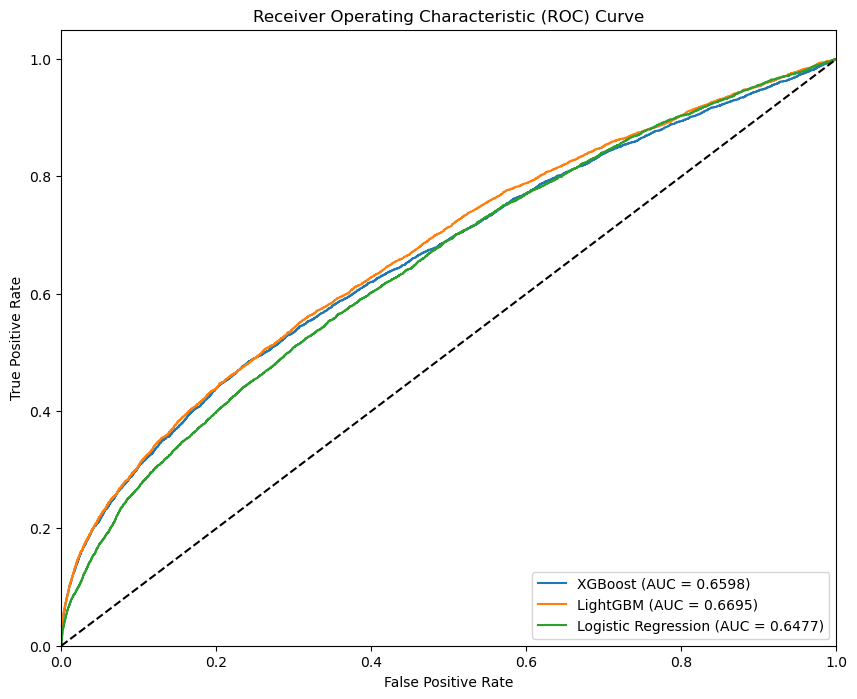

In [404]:
from sklearn.metrics import roc_curve, roc_auc_score
plt.figure(figsize=(10, 8))
for name, model in models4:
    print(f"Evaluating {name}...")
    model.fit(X_train, y_train)
    
    # ROC AUC
    y_pred_proba = model.predict_proba(X_test)[:, 1]
    fpr, tpr, _ = roc_curve(y_test, y_pred_proba)
    roc_auc = roc_auc_score(y_test, y_pred_proba)
    
    print(f"ROC AUC for {name}: {roc_auc:.4f}\n")
    
    # Plot ROC curve
    plt.plot(fpr, tpr, label=f'{name} (AUC = {roc_auc:.4f})')

# Plot settings
plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()

In [405]:
from sklearn.model_selection import GridSearchCV
from xgboost import XGBClassifier

# Define the parameter grid
param_grid = {
    'n_estimators': [300, 500],
    'learning_rate':[0.001,0.01, 0.1],
    'max_depth': [3, 5],
    'subsample': [0.8, 1.0],
    'colsample_bytree': [0.8, 1.0],
    'scale_pos_weight': [class_weights[0] / class_weights[1]]
}

# Initialize the XGBoost model
xgb_model = XGBClassifier(random_state=42)

# Initialize GridSearchCV
grid_search = GridSearchCV(estimator=xgb_model, param_grid=param_grid, scoring='f1', cv=3, n_jobs=-1, verbose=2)

# Fit the model
grid_search.fit(X_train_smote, y_train_smote)

# Print the best parameters
print("Best parameters found: ", grid_search.best_params_)
print("Best F1 score: ", grid_search.best_score_)

Fitting 3 folds for each of 48 candidates, totalling 144 fits
[CV] END colsample_bytree=0.8, learning_rate=0.001, max_depth=3, n_estimators=300, scale_pos_weight=0.03819504524024261, subsample=0.8; total time=13.1min
[CV] END colsample_bytree=0.8, learning_rate=0.001, max_depth=3, n_estimators=300, scale_pos_weight=0.03819504524024261, subsample=1.0; total time=13.3min
[CV] END colsample_bytree=0.8, learning_rate=0.001, max_depth=3, n_estimators=300, scale_pos_weight=0.03819504524024261, subsample=1.0; total time=13.7min
[CV] END colsample_bytree=0.8, learning_rate=0.001, max_depth=3, n_estimators=300, scale_pos_weight=0.03819504524024261, subsample=0.8; total time=14.1min
[CV] END colsample_bytree=0.8, learning_rate=0.001, max_depth=3, n_estimators=300, scale_pos_weight=0.03819504524024261, subsample=1.0; total time=14.4min
[CV] END colsample_bytree=0.8, learning_rate=0.001, max_depth=3, n_estimators=300, scale_pos_weight=0.03819504524024261, subsample=0.8; total time=14.5min
[CV] END

In [ ]:
# Best parameters found:  {'colsample_bytree': 1.0, 'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 500, 'scale_pos_weight': 0.03819504524024261, 'subsample': 0.8}
# Best F1 score:  0.8184053867816061

Train Accuracy: 0.6089108152855269
Test Accuracy: 0.24225865209471767
Classification Report:
               precision    recall  f1-score   support

           0       0.98      0.22      0.36    130614
           1       0.04      0.86      0.08      4989

    accuracy                           0.24    135603
   macro avg       0.51      0.54      0.22    135603
weighted avg       0.94      0.24      0.35    135603

Confusion Matrix:
 [[ 28556 102058]
 [   694   4295]]


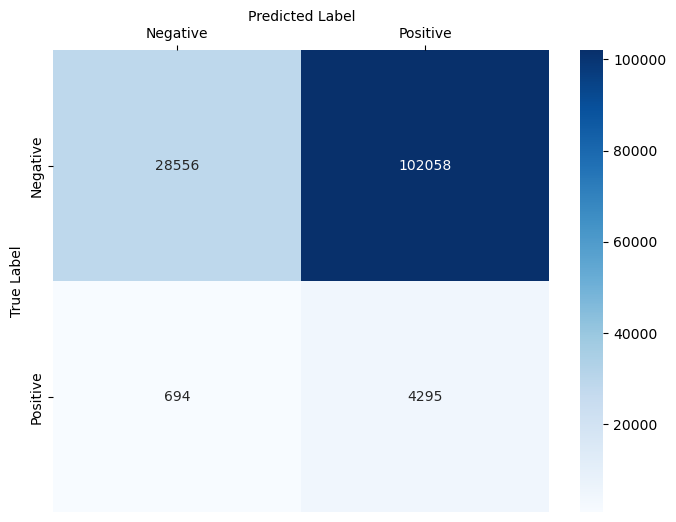

In [412]:
from sklearn.metrics import accuracy_score
best_params = {
    'colsample_bytree': 1.0,
    'learning_rate': 0.1,
    'max_depth': 5,
    'n_estimators': 500,
    'scale_pos_weight': 27,
    'subsample': 0.8
}

xgb_model = XGBClassifier(random_state=42, **best_params)

xgb_model.fit(X_train_smote, y_train_smote)

y_pred_train = xgb_model.predict(X_train_smote)
y_pred_test = xgb_model.predict(X_test)

train_accuracy = accuracy_score(y_train_smote, y_pred_train)
test_accuracy = accuracy_score(y_test, y_pred_test)

report = classification_report(y_test, y_pred_test)

print("Train Accuracy:", train_accuracy)
print("Test Accuracy:", test_accuracy)
print("Classification Report:\n", report)

# Generate confusion matrix
cm = confusion_matrix(y_test, y_pred_test)
print("Confusion Matrix:\n", cm)

# Plot confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['Negative', 'Positive'], yticklabels=['Negative', 'Positive'])
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.gca().xaxis.set_label_position('top')
plt.gca().xaxis.tick_top()
plt.show()

In [413]:
from sklearn.model_selection import GridSearchCV
from lightgbm import LGBMClassifier
param_grid_lgbm = {
    'n_estimators': [200, 300, 500],
    'learning_rate': [0.001, 0.01, 0.1,],
    'max_depth': [3, 5],
    'subsample': [0.8, 1.0],
    'colsample_bytree': [0.8, 1.0],
    'class_weight': ['balanced']
}

lgbm_model = LGBMClassifier(random_state=42)
grid_search_lgbm = GridSearchCV(estimator=lgbm_model, param_grid=param_grid_lgbm, scoring='f1', cv=3, n_jobs=-1, verbose=2)
grid_search_lgbm.fit(X_train_smote, y_train_smote)
print("Best parameters found for LightGBM: ", grid_search_lgbm.best_params_)
print("Best F1 score for LightGBM: ", grid_search_lgbm.best_score_)

Fitting 3 folds for each of 72 candidates, totalling 216 fits


python(65899) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(65900) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(65901) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(65902) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(65903) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(65904) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(65905) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(65906) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
/Users/ayseljafarova/anaconda3/lib/python3.11/site-packages/dask/dataframe/_pyarrow_compat.py:23: UserWarning: You are using pyarrow version 11.0.0 which is known to be insecure. See https://www.cve.org/CVERecord?id=

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 348303, number of negative: 348304
[LightGBM] [Info] Number of positive: 348304, number of negative: 348303
[LightGBM] [Info] Number of positive: 348303, number of negative: 348303
[LightGBM] [Info] Number of positive: 348303, number of negative: 348303
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 348303, number of negative: 348304
[LightGBM] [Warning] Found whitespace in feature_names, replace with underl

In [414]:
from lightgbm import LGBMClassifier
from sklearn.metrics import classification_report

best_params_lgbm = {'class_weight': 'balanced',
 'colsample_bytree': 1.0,
  'learning_rate': 0.1, 
'max_depth': 5, 
'n_estimators': 500,
 'subsample': 0.8}


lgbm_model = LGBMClassifier(random_state=42, **best_params_lgbm)

lgbm_model.fit(X_train_smote, y_train_smote)

y_pred = lgbm_model.predict(X_test)

report = classification_report(y_test, y_pred)
print("Classification Report:\n", report)

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 522455, number of negative: 522455
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006762 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 874
[LightGBM] [Info] Number of data points in the train set: 1044910, number of used features: 47
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits 

In [415]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import GridSearchCV

# Define the parameter grid for Logistic Regression
param_grid_lr = {
    'penalty': ['l1', 'l2', 'elasticnet', 'none'],
    'C': [0.01, 0.1, 1, 10, 100],
    'solver': ['newton-cg', 'lbfgs', 'liblinear', 'sag', 'saga'],
    'max_iter': [100, 200, 300],
    'class_weight': ['balanced']
}

# Initialize the Logistic Regression model
lr_model = LogisticRegression(random_state=42)

# Initialize GridSearchCV
grid_search_lr = GridSearchCV(estimator=lr_model, param_grid=param_grid_lr, scoring='f1', cv=3, n_jobs=-1, verbose=2)

# Train the model using GridSearchCV
grid_search_lr.fit(X_train_smote, y_train_smote)

# Print the best parameters and score
print("Best parameters found for Logistic Regression: ", grid_search_lr.best_params_)
print("Best F1 score for Logistic Regression: ", grid_search_lr.best_score_)

Fitting 3 folds for each of 300 candidates, totalling 900 fits


python(82249) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(82250) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(82251) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(82252) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(82253) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(82254) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(82255) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(82256) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


[CV] END C=0.01, class_weight=balanced, max_iter=100, penalty=l1, solver=newton-cg; total time=   1.7s
[CV] END C=0.01, class_weight=balanced, max_iter=100, penalty=l1, solver=lbfgs; total time=   1.7s
[CV] END C=0.01, class_weight=balanced, max_iter=100, penalty=l1, solver=lbfgs; total time=   2.0s
[CV] END C=0.01, class_weight=balanced, max_iter=100, penalty=l1, solver=newton-cg; total time=   2.0s
[CV] END C=0.01, class_weight=balanced, max_iter=100, penalty=l1, solver=newton-cg; total time=   2.1s
[CV] END C=0.01, class_weight=balanced, max_iter=100, penalty=l1, solver=lbfgs; total time=   2.1s
[CV] END C=0.01, class_weight=balanced, max_iter=100, penalty=l1, solver=sag; total time=   0.5s
[CV] END C=0.01, class_weight=balanced, max_iter=100, penalty=l1, solver=sag; total time=   0.8s
[CV] END C=0.01, class_weight=balanced, max_iter=100, penalty=l1, solver=sag; total time=   1.1s
[CV] END C=0.01, class_weight=balanced, max_iter=100, penalty=l1, solver=liblinear; total time=  46.2s


/Users/ayseljafarova/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[CV] END C=1, class_weight=balanced, max_iter=100, penalty=l2, solver=lbfgs; total time= 1.3min
[CV] END C=1, class_weight=balanced, max_iter=100, penalty=l2, solver=newton-cg; total time= 1.8min
[CV] END C=1, class_weight=balanced, max_iter=100, penalty=l2, solver=liblinear; total time=  11.3s
[CV] END C=1, class_weight=balanced, max_iter=100, penalty=l1, solver=saga; total time= 2.2min
[CV] END C=1, class_weight=balanced, max_iter=100, penalty=l2, solver=newton-cg; total time= 1.8min
[CV] END C=1, class_weight=balanced, max_iter=100, penalty=l2, solver=liblinear; total time=  14.8s
[CV] END C=1, class_weight=balanced, max_iter=100, penalty=l1, solver=saga; total time= 2.2min
[CV] END C=1, class_weight=balanced, max_iter=100, penalty=l2, solver=liblinear; total time=  18.1s
[CV] END C=1, class_weight=balanced, max_iter=100, penalty=elasticnet, solver=newton-cg; total time=   0.5s
[CV] END C=1, class_weight=balanced, max_iter=100, penalty=elasticnet, solver=newton-cg; total time=   0.4

/Users/ayseljafarova/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[CV] END C=100, class_weight=balanced, max_iter=100, penalty=none, solver=liblinear; total time=   0.6s
[CV] END C=100, class_weight=balanced, max_iter=100, penalty=l2, solver=lbfgs; total time= 1.2min
[CV] END C=100, class_weight=balanced, max_iter=100, penalty=none, solver=sag; total time=   0.5s
[CV] END C=100, class_weight=balanced, max_iter=100, penalty=none, solver=sag; total time=   0.4s
[CV] END C=100, class_weight=balanced, max_iter=100, penalty=none, solver=sag; total time=   0.4s
[CV] END C=100, class_weight=balanced, max_iter=100, penalty=none, solver=saga; total time=   0.5s
[CV] END C=100, class_weight=balanced, max_iter=100, penalty=none, solver=saga; total time=   0.5s
[CV] END C=100, class_weight=balanced, max_iter=100, penalty=none, solver=saga; total time=   0.5s
[CV] END C=100, class_weight=balanced, max_iter=200, penalty=l1, solver=newton-cg; total time=   0.5s
[CV] END C=100, class_weight=balanced, max_iter=200, penalty=l1, solver=newton-cg; total time=   0.5s
[CV

In [416]:
best_params_lr = {
    'penalty': 'l2',
    'C': 1,
    'solver': 'lbfgs',
    'max_iter': 200,
    'class_weight': 'balanced'
}

# Initialize the Logistic Regression model with the best parameters
lr_model = LogisticRegression(
    penalty=best_params_lr['penalty'],
    C=best_params_lr['C'],
    solver=best_params_lr['solver'],
    max_iter=best_params_lr['max_iter'],
    class_weight=best_params_lr['class_weight'],
    random_state=42
)

# Train the model
lr_model.fit(X_train_smote, y_train_smote)

# Make predictions on the test set
y_pred = lr_model.predict(X_test)

# Evaluate the model
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.97      0.70      0.82    130614
           1       0.05      0.39      0.08      4989

    accuracy                           0.69    135603
   macro avg       0.51      0.55      0.45    135603
weighted avg       0.93      0.69      0.79    135603

